conda info --envs
conda create -n upxo313 python=3.13
conda info --envs
conda activate upxo313
conda info --envs

conda install -c conda-forge numpy scipy scikit-learn 
pip install scikit-image
pip install pyvista matplotlib seaborn pandas networkx numba xlrd termcolor
pip install connected-components-3d
pip install defdap
pip install opencv-python
pip install gmsh
pip install pygmsh

conda list

GO TO UPXO FODLER ON TERMINAL AND: 
pip install .

# repgen2d — EBSD target grain structure workflow
Load an EBSD `.ctf` file as the **target grain structure**, crop it to a region of interest, clean non-indexed / boundary pixels, compute grain statistics, and visualise the result using the `repgen2d` + `EBSDReader` + `ebsdviz` pipeline.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from upxo.repgen.repgen2dmcgs import repgen2d
from upxo.interfaces.defdap.ebsd_reader import EBSDReader
import upxo.viz.ebsdviz as ebsdviz

Imports `repgen2d`, `EBSDReader`, and `ebsdviz`. `%matplotlib inline` keeps plots inline.

## 1. Load EBSD file

In [2]:
CTF_FILE       = r'C:\Development\EBSD datasets\UKAEA__OFHCCu\OFHC_Cu_dataset\EBSD_pre\warp_out.ctf'
MIN_GRAIN_SIZE = 10   # pixels — grains smaller than this are flagged -2
MISORI_TOL     = 8    # degrees — grain-boundary misorientation threshold
rdr = EBSDReader.from_file(CTF_FILE, min_grain_size=MIN_GRAIN_SIZE, misori_tol=MISORI_TOL)
print(rdr)
print(f'\nRaw map shape  : {rdr.shape}')
print(f'Step size      : {rdr.step_size} µm')
print(f'Grains (raw)   : {rdr.n_grains}')

Loaded EBSD data (dimensions: 2051 x 1452 pixels, step size: 0.2 um)
Finished building quaternion array (0:00:10) 
Finished finding grain boundaries (0:00:16) 
Finished finding grains (0:00:10) 
EBSDReader(file='warp_out.ctf', shape=(1452, 2051), n_grains=1714, step_size=0.2 um)

Raw map shape  : (1452, 2051)
Step size      : 0.2 µm
Grains (raw)   : 1714


## 2. Crop to region of interest
`[xstart%, ystart%, xend%, yend%]` — percentages of the full map dimensions.

In [3]:
CROP_REGION = [5, 5, 80, 80]

rdr = rdr.crop(CROP_REGION, inplace=False)
print(rdr)

[crop] region=[5, 5, 80, 80]%  →  rows 73:1162, cols 103:1641  |  original 1452×2051  →  cropped 1089×1538
EBSDReader(file='warp_out.ctf', shape=(1089, 1538), n_grains=1403, step_size=0.2 um)


Crops the map to `[xstart%, ystart%, xend%, yend%]` as percentages of full dimensions. Returns a new `EBSDReader`.

## 3. Build `repgen2d` with EBSD target

In [4]:
rg = repgen2d.from_tgs(tgs=None, tgstype='ebsd2d', ebsd_file=CTF_FILE)
print(f'iroute   : {rg.iroute}')
print(f'tgstype  : {rg.tgstype}')

iroute   : tgs.sgs
tgstype  : ebsd2d


`repgen2d.from_tgs(..., tgstype='ebsd2d')` creates the representative-generation object backed by an EBSD target.

## 4. Clean (characterise): fill non-indexed / boundary pixels, compute morphology & neighbours
Uses `EBSDReader.characterise()` — fills non-positive pixels, computes per-grain morphology and first-order neighbour graph.

In [5]:
import time, warnings

t0 = time.perf_counter()
with warnings.catch_warnings(record=True):
    warnings.simplefilter('always')
    result = rdr.characterise(connectivity=4)
elapsed = time.perf_counter() - t0

# Assign results to repgen slots
rg.lfi_ebsd       = result['lfi']
rg.euler_ebsd     = result['euler']
rg.quat_ebsd      = result['quat']
rg.neigh_gid_ebsd = result['neigh_gid']
rg.prop_ebsd      = result['prop']

print(f'characterise() completed in {elapsed:.1f} s')
print(f'Non-positive pixels remaining : {int(np.sum(rg.lfi_ebsd <= 0))}')
print(f'Grains after cleaning         : {int(rg.lfi_ebsd.max())}')
print(f'Neighbour entries             : {len(rg.neigh_gid_ebsd)}')
print(f'prop_ebsd grain count         : {len(rg.prop_ebsd)}')

[rechar_lfi] Map 1089×1538  |  unknown pixels: 8923 (0.53%)  |  connectivity=4
[rechar_lfi] Step 1/5 — labelling unknown connected components …
[rechar_lfi]           6472 connected components found.
[rechar_lfi] Step 2/5 — computing grain adjacency …
[rechar_lfi] Step 3/5 — assigning CC pixels to grains …


  assigning CCs:   0%|          | 0/6472 [00:00<?, ?CC/s]

[rechar_lfi]           6472/6472 CCs assigned (8923 pixels filled).
[rechar_lfi] Step 4/5 — computing grain-average orientations (vectorized) …
[rechar_lfi]           415 unique grains to average over.
[rechar_lfi]           averaging Euler channels (3) …
[rechar_lfi]           averaging quaternion channels (4) …
[rechar_lfi]           orientation averages ready.
[rechar_lfi] Step 5/5 — writing orientations for 8923 unknown pixels (vectorised, no loop) …
[rechar_lfi]           8923 pixels written (0 isolated islands left unfilled).
[rechar_lfi] Done.
characterise() completed in 16.4 s
Non-positive pixels remaining : 0
Grains after cleaning         : 1403
Neighbour entries             : 950
prop_ebsd grain count         : 950


`characterise()` fills non-indexed pixels, labels grains, computes morphology, quaternions, and 4-connected neighbour graph. Results are stored in `rg.*_ebsd` slots.

## 5. Compute grain statistics

In [6]:
rg.compute_ebsd_stats()

print(f"{'Property':<22}  {'mean':>10}  {'std':>10}  {'min':>10}  {'max':>10}  {'count':>6}")
print('-' * 75)
for prop, s in rg.stat_ebsd.items():
    print(f"{prop:<22}  {s['mean']:>10.3f}  {s['std']:>10.3f}  "
          f"{s['min']:>10.3f}  {s['max']:>10.3f}  {s['count']:>6d}")

Property                      mean         std         min         max   count
---------------------------------------------------------------------------
area                        70.521     183.261       0.040    2417.560     950
perimeter                   33.156      45.596       0.000     408.907     950
eq_diameter                  6.495       6.903       0.226      55.481     950
aspect_ratio                 3.587       3.703       1.004      42.706     947
major_axis_length           11.077      11.028       0.000      74.283     950
minor_axis_length            4.796       5.988       0.000      55.955     950
eccentricity                 0.867       0.136       0.000       1.000     950
solidity                     0.843       0.091       0.448       1.000     950
npixels                   1763.034    4581.522       1.000   60439.000     950


Per-property mean / std / min / max / count from `rg.stat_ebsd` (populated by `compute_ebsd_stats()`).

## 6. Grain size distribution

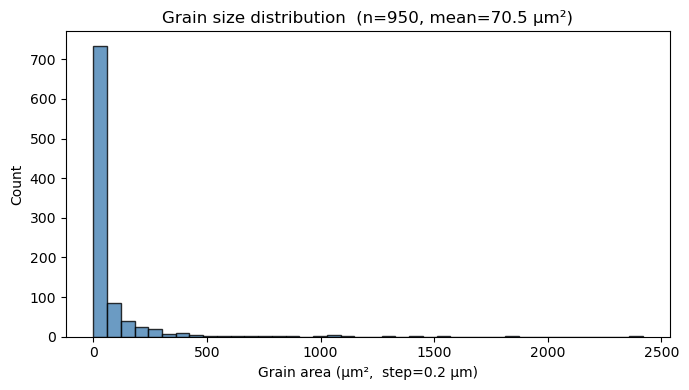

Area stats (µm²):  min=0.04  max=2417.56  mean=70.52  median=13.40


In [7]:
areas = np.array([v['area'] for v in rg.prop_ebsd.values()])

fig, ax = plt.subplots(figsize=(7, 4))
ax.hist(areas, bins=40, color='steelblue', edgecolor='k', alpha=0.8)
ax.set_xlabel(f'Grain area (µm²,  step={rdr.step_size} µm)')
ax.set_ylabel('Count')
ax.set_title(f'Grain size distribution  (n={len(areas)}, mean={areas.mean():.1f} µm²)')
plt.tight_layout()
plt.show()

print(f'Area stats (µm²):  min={areas.min():.2f}  max={areas.max():.2f}  '
      f'mean={areas.mean():.2f}  median={np.median(areas):.2f}')

Grain area histogram (pixel counts × step² = µm²). Useful for assessing grain size bimodality or outliers.

## 7. Visualise cleaned grain map with boundaries

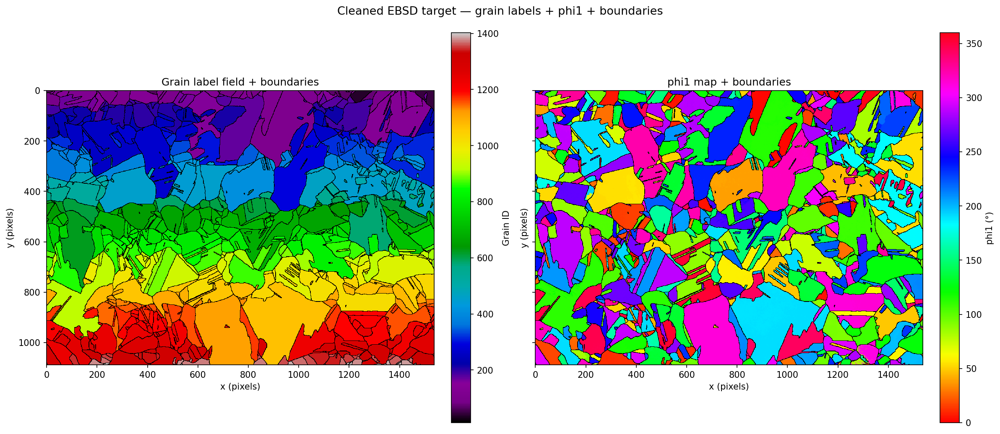

Grain-boundary pixels : 181872  (10.86% of map)


In [8]:
# Wrap cleaned arrays back into an EBSDReader for ebsdviz compatibility
rdr_clean = EBSDReader.__new__(EBSDReader)
rdr_clean.lfi_ebsd   = rg.lfi_ebsd
rdr_clean.euler_ebsd = rg.euler_ebsd
rdr_clean.quat_ebsd  = rg.quat_ebsd
rdr_clean.step_size  = rdr.step_size
rdr_clean.file_path  = rdr.file_path
rdr_clean.shape      = rg.lfi_ebsd.shape

fig, axes = ebsdviz.plot_grain_structure_with_boundaries(
    rdr_clean,
    show_euler_panel=True,
    euler_channel=0,          # 0=phi1, 1=Phi, 2=phi2
    boundary_color=(0, 0, 0),
    figsize=(16, 7),
    dpi=150,
    suptitle='Cleaned EBSD target — grain labels + phi1 + boundaries',
)

Side-by-side grain label map + phi1 Euler channel with grain boundaries overlaid. `rdr_clean` wraps cleaned arrays for `ebsdviz` compatibility.

## 8. All three Euler channels

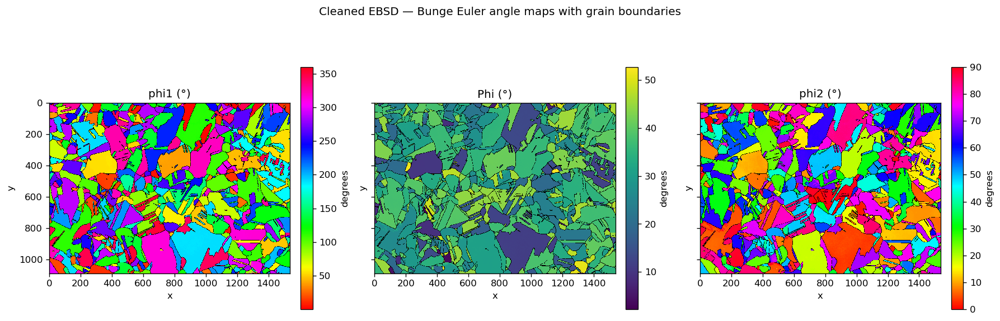

(<Figure size 1800x600 with 6 Axes>,
 array([<Axes: title={'center': 'phi1 (°)'}, xlabel='x', ylabel='y'>,
        <Axes: title={'center': 'Phi (°)'}, xlabel='x', ylabel='y'>,
        <Axes: title={'center': 'phi2 (°)'}, xlabel='x', ylabel='y'>],
       dtype=object))

In [9]:
ebsdviz.plot_euler_maps(
    rdr_clean,
    show_boundaries=True,
    figsize=(15, 5),
    dpi=120,
    suptitle='Cleaned EBSD — Bunge Euler angle maps with grain boundaries',
)

All three Bunge Euler channels (φ₁, Φ, φ₂) plotted with boundary overlay for texture inspection.

## 9. Generate simulated grain structures

In [10]:
from upxo.ggrowth.mcgs import mcgs
import matplotlib.pyplot as plt
import seaborn as sns

input_dashboard = 'C:\\Development\\UPXO\\upxo_library\\src\\upxo\\demos\\repGen\\tgs2d.xls'
pxt = mcgs(input_dashboard=input_dashboard)
pxt.simulate(verbose=False)
pxt.detect_grains()

print(f'Temporal slices available: {pxt.m}')

# --- characterise every temporal slice startkimng from 2nd---
for tslice in pxt.m[2:]:
    gs = pxt.gs[tslice]
    gs.char_morph_2d(
        use_version=2,
        bbox=True, bbox_ex=False,
        npixels=False, identify_pixel_locations=True, npixels_gb=False,
        area=True, aspect_ratio=True, solidity=True,
        major_axis_length=True, minor_axis_length=True,
        circularity=False, eccentricity=False, euler_number=False,
        moments_hu=False,
        append=False, saa=True, throw=False,
        char_grain_positions=False, find_neigh=False,
        char_gb=False, make_skim_prop=True,
        get_grain_coords=True,
    )
    print(f'  tslice={tslice:4d}  grains={gs.n}  '
          f'prop keys: {list(gs.prop.keys()) if hasattr(gs.prop, "keys") else type(gs.prop)}')

# keep a reference to the last slice for downstream cells
tslice   = pxt.m[-1]
gstslice = pxt.gs[tslice]
print(f'\nActive slice set to tslice={tslice}  (last)')


C:\Development\UPXO\upxo_library\src\upxo\interfaces\user_inputs
C:\Development\UPXO\upxo_library\src\upxo\demos\repGen\tgs2d.xls
Algo_hops details
(('200.0', 100),)
[False]

 Initiating Monte-Carlo simulation
     xmin, xmax, xinc: 0.0, 250.0, 1.0
     ymin, ymax, yinc: 0.0, 200.0, 1.0
     zmin, zmax, zinc: 0.0, 100.0, 1.0
     No. of states: 20
     Dimensionality: 2
Using ALG-200: SA's SL NL-1 TP1 C2 unweighted Q-Pott's model:
|--------------- MC SIM RUN IN PROGRESS on: ALG200---------------|
GS temporal slice 0 stored
GS temporal slice 1 stored
GS temporal slice 2 stored
GS temporal slice 3 stored
GS temporal slice 4 stored
GS temporal slice 5 stored
GS temporal slice 6 stored
GS temporal slice 7 stored
GS temporal slice 8 stored
GS temporal slice 9 stored
GS temporal slice 10 stored
GS temporal slice 11 stored
GS temporal slice 12 stored
GS temporal slice 13 stored
GS temporal slice 14 stored
GS temporal slice 15 stored
GS temporal slice 16 stored
GS temporal slice 17 stored
GS t

MC simulation using `tgs2d.xls` dashboard. Every temporal slice (from index 2 onward) is characterised with morphology properties. `gstslice` holds the last slice.

In [11]:
# All slices already characterised above.
# Inspect the prop DataFrame of the last (active) slice.
print(f'gstslice (tslice={tslice}) — prop shape: {gstslice.prop.shape}')
gstslice.prop.head()

gstslice (tslice=19) — prop shape: (489, 5)


,area,aspect_ratio,solidity,major_axis_length,minor_axis_length
0,48.0,1.296867,0.979592,8.923909,6.881131
1,57.0,1.088927,0.950000,8.932458,8.202991
2,93.0,1.639621,0.845455,14.595402,8.901694
3,83.0,1.048020,0.932584,10.650214,10.162228
4,89.0,1.501417,0.967391,13.179578,8.778095


Quick check: `prop` DataFrame shape and first rows for the active (last) temporal slice.

In [12]:
print(f'Number of grains in experimental (EBSD) grain structure: {rdr.lfi_ebsd.max()}')

print('\nNumber of grains per characterised tslice (simulated):')
for ts in pxt.m:
    print(f'  tslice={ts:4d}  n_grains={pxt.gs[ts].n}')


Number of grains in experimental (EBSD) grain structure: 1403

Number of grains per characterised tslice (simulated):
  tslice=   0  n_grains=14304
  tslice=   1  n_grains=6297
  tslice=   2  n_grains=3679
  tslice=   3  n_grains=2711
  tslice=   4  n_grains=2167
  tslice=   5  n_grains=1827
  tslice=   6  n_grains=1605
  tslice=   7  n_grains=1427
  tslice=   8  n_grains=1268
  tslice=   9  n_grains=1124
  tslice=  10  n_grains=1006
  tslice=  11  n_grains=911
  tslice=  12  n_grains=837
  tslice=  13  n_grains=786
  tslice=  14  n_grains=705
  tslice=  15  n_grains=658
  tslice=  16  n_grains=607
  tslice=  17  n_grains=569
  tslice=  18  n_grains=523
  tslice=  19  n_grains=489


Compares grain count of the EBSD target vs. each simulated slice — helps choose the best-matching temporal slice.

## Select closest temporal slice for sim gs

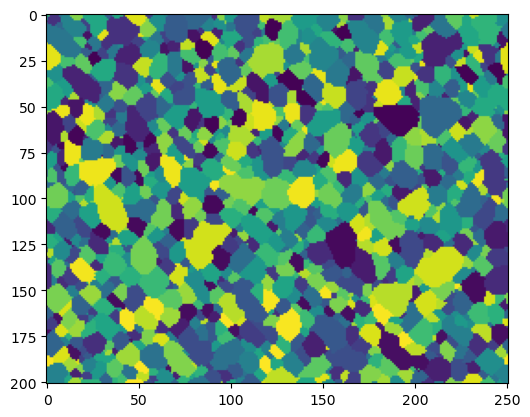

In [14]:
tslice = pxt.m[10]
gs = pxt.gs[tslice]
plt.imshow(gs.lfi)

## MDF calcualtion
Compute grain-boundary MDF (24×24 cubic-symmetry search). Per-grain quaternions are averaged (positive-w hemisphere) before disorientation calculation. Returns the `mdf` dict needed for down the tream pipelines.

Unique grain-boundary pairs : 2403
Misorientation range        : 0.07° – 62.10°
Mean disorientation         : 47.18° ± 12.86°


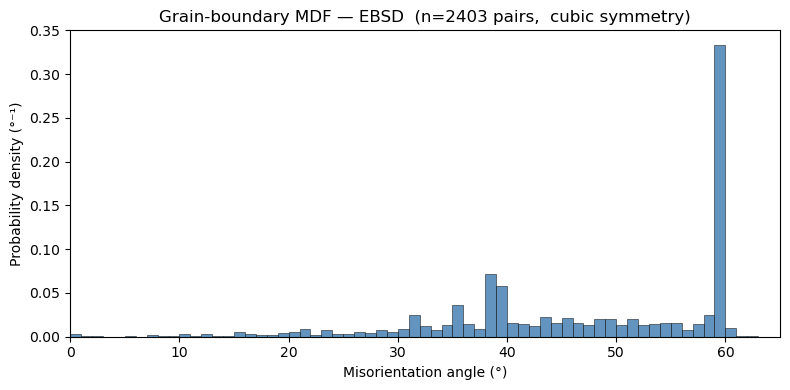

In [15]:
import importlib, upxo.xtalphy.crystal_orientation as _co
importlib.reload(_co)
from upxo.xtalphy.crystal_orientation import compute_mdf_from_quats

mdf = compute_mdf_from_quats(rg.lfi_ebsd, rg.quat_ebsd, rg.neigh_gid_ebsd)

print(f'Unique grain-boundary pairs : {mdf["n_pairs"]}')
print(f'Misorientation range        : {mdf["miso_deg"].min():.2f}° – {mdf["miso_deg"].max():.2f}°')
print(f'Mean disorientation         : {mdf["mean_angle"]:.2f}° ± {mdf["std_angle"]:.2f}°')

fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(mdf['hist_bin_centers'], mdf['hist_density'],
       width=mdf['hist_bin_edges'][1] - mdf['hist_bin_edges'][0],
       color='steelblue', edgecolor='k', linewidth=0.4, alpha=0.85)
ax.set_xlabel('Misorientation angle (°)')
ax.set_ylabel('Probability density (°⁻¹)')
ax.set_title(f'Grain-boundary MDF — EBSD  (n={mdf["n_pairs"]} pairs,  cubic symmetry)')
ax.set_xlim(0, 65)
plt.tight_layout()
plt.show()


## Identify peaks in MDF

────────────────────Detected peaks─────────────────────
  12.5°  (density=0.0029)
  15.5°  (density=0.0050)
  21.5°  (density=0.0092)
  31.5°  (density=0.0246)
  35.5°  (density=0.0362)  ≈ Σ5 (Δ=-1.4°)
  38.5°  (density=0.0720)  ≈ Σ7 (Δ=+0.3°)
  43.5°  (density=0.0221)
  51.5°  (density=0.0204)  ≈ Σ11 (Δ=+1.0°)
  54.5°  (density=0.0162)
  59.5°  (density=0.3333)  ≈ Σ3  (twin) (Δ=-0.5°)


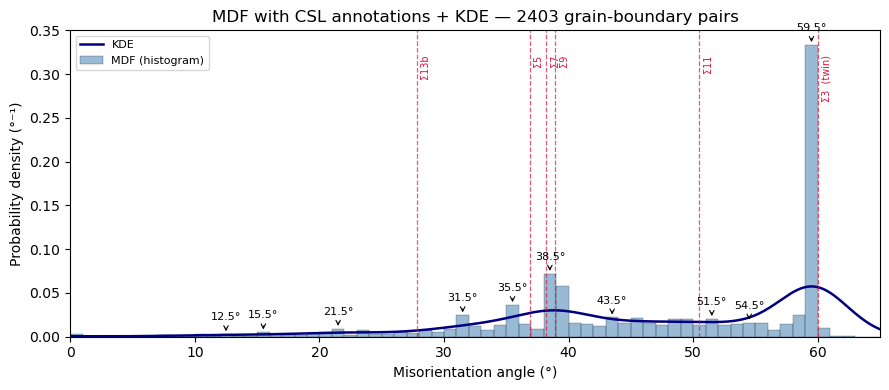

In [16]:
import importlib
import upxo.xtalphy.crystal_orientation as _co
import upxo.viz.ebsdviz as _ev
importlib.reload(_co); importlib.reload(_ev)

from upxo.xtalphy.crystal_orientation import detect_mdf_peaks
import upxo.viz.ebsdviz as ebsdviz

peaks = detect_mdf_peaks(mdf)

print(f"{'Detected peaks':─^55}")
for label, (csl_name, delta) in zip(peaks['peak_labels'], peaks['csl_nearest']):
    print(f'  {label}')

ebsdviz.plot_mdf(mdf, peaks)
plt.show()


Detects histogram peaks (`scipy.signal.find_peaks`), matches them to cubic CSL angles (Σ3 60°, Σ5 36.9°, …), fits a KDE, and plots the annotated MDF. Results stored in `peaks` dict.

## Selecrt the peaks of interest from MDF

In [ ]:
selected_peaks = ebsdviz.mdf_peak_selector(peaks)

Select which MDF peaks to retain for downstream analysis:


## View the selected peaks and replot

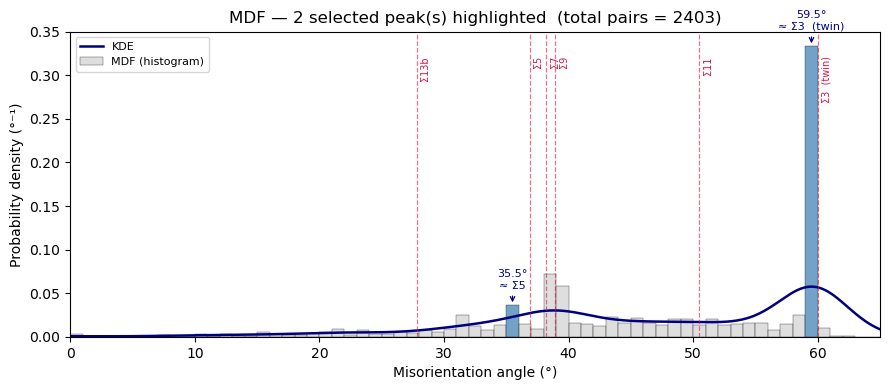

Selected peak angles : [35.5, 59.5]


In [18]:
ebsdviz.plot_mdf_selected(mdf, peaks, selected_peaks)
plt.show()
print(f'Selected peak angles : {selected_peaks["angles"]}')


## `peaks` dictionary keys

| Key | Description |
|-----|-------------|
| `peak_labels` | Pak label names e.g. `"38.5° ← near Σ5 (Δ=+1.6°)"` |
| `peak_angles` | Detected peak positions in degrees |
| `peak_indices` | Histogram bin indices of detected peaks |
| `csl_nearest` | List of `(csl_name, delta_deg)` tuples — closest CSL to each peak |
| `csl` | Dict mapping CSL name → reference angle (e.g. `{'Σ3': 60.0, 'Σ5': 36.9, ...}`) |
| `csl_tol` | Tolerance in degrees for CSL matching (used by `segregate_csl_pairs`) |
| `kde_x` | KDE evaluation points (degrees) |
| `kde_y` | KDE density values |

## 11. Segregate grain pairs by CSL type

In [19]:
import importlib
import upxo.xtalphy.crystal_orientation as _co
import upxo.viz.ebsdviz as _ev
importlib.reload(_co); importlib.reload(_ev)

from upxo.xtalphy.crystal_orientation import segregate_csl_pairs
import upxo.viz.ebsdviz as ebsdviz

# Segregate using selected_peaks from the widget cell
csl_grains = segregate_csl_pairs(mdf, selected_peaks,
                csl=peaks['csl'], csl_tol=peaks['csl_tol'])

# Summary table
print(f"{'CSL type':<18} {'ref °':>6}  {'pairs':>6}  {'grains':>7}")
print('─' * 42)
for lbl, info in csl_grains.items():
    print(f"{lbl:<18} {info['csl_angle']:>6.2f}  "
          f"{info['n_pairs']:>6}  {info['n_grains']:>7}")


CSL type            ref °   pairs   grains
──────────────────────────────────────────
Σ5                  36.87     278      373
Σ3  (twin)          60.00     886      860


Uses `mdf['pairs']` + `mdf['miso_deg']` to group boundary pairs within `csl_tol` of each selected CSL reference angle. `csl_grains` maps each label to its pairs, grain IDs, and counts.

In [20]:
csl_grains

{'Σ5': {'csl_angle': 36.87,
  'pairs': array([[  60,  102],
         [  64,  115],
         [  70,  152],
         [  85,  139],
         [  85,  155],
         [  87,  132],
         [  88,  118],
         [  90,  197],
         [  95,  170],
         [  95,  178],
         [  96,  149],
         [  99,  202],
         [ 101,  140],
         [ 101,  187],
         [ 101,  211],
         [ 102,  206],
         [ 110,  264],
         [ 110,  409],
         [ 110,  425],
         [ 114,  206],
         [ 116,  132],
         [ 119,  156],
         [ 119,  157],
         [ 126,  159],
         [ 132,  145],
         [ 133,  169],
         [ 137,  339],
         [ 140,  311],
         [ 154,  170],
         [ 154,  290],
         [ 154,  334],
         [ 154,  426],
         [ 170,  389],
         [ 176,  214],
         [ 187,  277],
         [ 187,  318],
         [ 193,  206],
         [ 201,  255],
         [ 202,  253],
         [ 203,  227],
         [ 203,  253],
         [ 209,  274

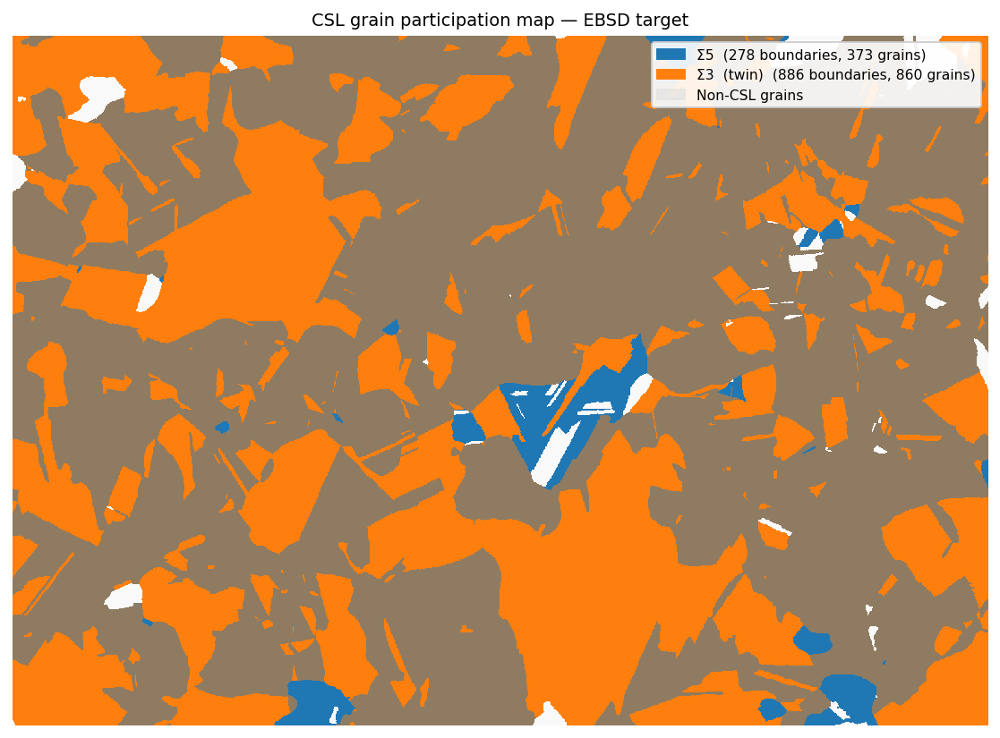

In [21]:
ebsdviz.plot_csl_grain_map(
    rg.lfi_ebsd,
    csl_grains,
    figsize=(11, 6),
    dpi=140,
    suptitle='CSL grain participation map — EBSD target',
)
plt.show()


Grain map coloured by CSL participation. Each CSL type gets a distinct tableau colour; grains touching two types are blended. Non-CSL grains are semi-transparent grey.

## 12. CSL twinned volume fractions

CSL type            ref °   grains    pixels   VF (indexed)   VF (total)
──────────────────────────────────────────────────────────────────────
Σ5                  36.87      373   1077943        64.36%      64.36%
Σ3  (twin)          60.00      860   1602869        95.70%      95.70%


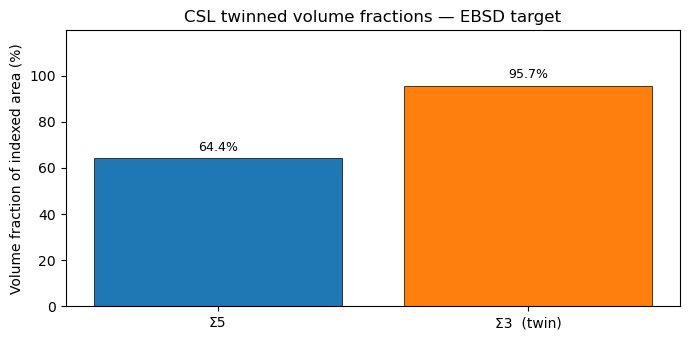

In [22]:
import importlib
import upxo.xtalphy.crystal_orientation as _co
importlib.reload(_co)
from upxo.xtalphy.crystal_orientation import csl_volume_fractions

vf = csl_volume_fractions(rg.lfi_ebsd, csl_grains)

# ── Table ─────────────────────────────────────────────────────────────────────
print(f"{'CSL type':<18} {'ref °':>6}  {'grains':>7}  "
      f"{'pixels':>8}  {'VF (indexed)':>13}  {'VF (total)':>11}")
print('─' * 70)
for lbl, v in vf.items():
    print(f"{lbl:<18} {v['csl_angle']:>6.2f}  {v['n_grains']:>7}  "
          f"{v['n_pixels']:>8}  {v['vf_indexed']:>12.2%}  {v['vf_total']:>10.2%}")

# ── Bar chart ─────────────────────────────────────────────────────────────────
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

palette   = list(mcolors.TABLEAU_COLORS.values())
labels    = list(vf.keys())
vf_vals   = [vf[l]['vf_indexed'] * 100 for l in labels]
colors    = [palette[i % len(palette)] for i in range(len(labels))]

fig, ax = plt.subplots(figsize=(7, 3.5))
bars = ax.bar(labels, vf_vals, color=colors, edgecolor='k', linewidth=0.5)
ax.bar_label(bars, fmt='%.1f%%', padding=3, fontsize=9)
ax.set_ylabel('Volume fraction of indexed area (%)')
ax.set_title('CSL twinned volume fractions — EBSD target')
ax.set_ylim(0, max(vf_vals) * 1.25)
plt.tight_layout()
plt.show()


Pixel count of grains in each CSL class divided by total indexed pixels. `vf_indexed` is the more meaningful metric; `vf_total` accounts for non-indexed regions. Note: fractions can exceed 100% total if grains participate in multiple CSL types.

## 13. Identify parent grains for each CSL type

For every CSL boundary pair, the **larger** grain (by pixel area) is designated the **parent** and the smaller the **twin/child**. A grain can appear as parent in some pairs and twin in others (twin chains: A→B→C). Grains are therefore classified as:

- **Pure parent** – larger grain in *every* pair it participates in  
- **Pure twin** – smaller grain in *every* pair  
- **Intermediate** – both roles across different pairs (secondary twinning)

CSL type            ref °   pairs   pure parents   pure twins   intermediates
───────────────────────────────────────────────────────────────────────────
Σ5                  36.87     278            129          196              48
Σ3  (twin)          60.00     886            148          495             217


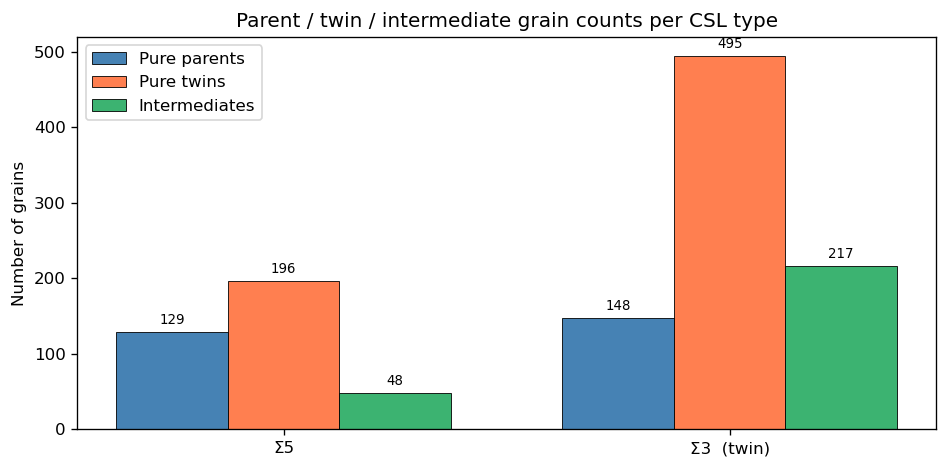

In [23]:
import importlib
import upxo.xtalphy.crystal_orientation as _co
import upxo.viz.ebsdviz as ebsdviz
importlib.reload(_co)
importlib.reload(ebsdviz)
from upxo.xtalphy.crystal_orientation import identify_parent_grains
from upxo.viz.ebsdviz import print_parent_grain_summary, plot_parent_grain_summary

parent_info = identify_parent_grains(csl_grains, rg.prop_ebsd)

print_parent_grain_summary(parent_info, csl_grains)

fig, ax = plot_parent_grain_summary(
    parent_info,
    figsize=(8, 4),
    dpi=120,
    title='Parent / twin / intermediate grain counts per CSL type',
)


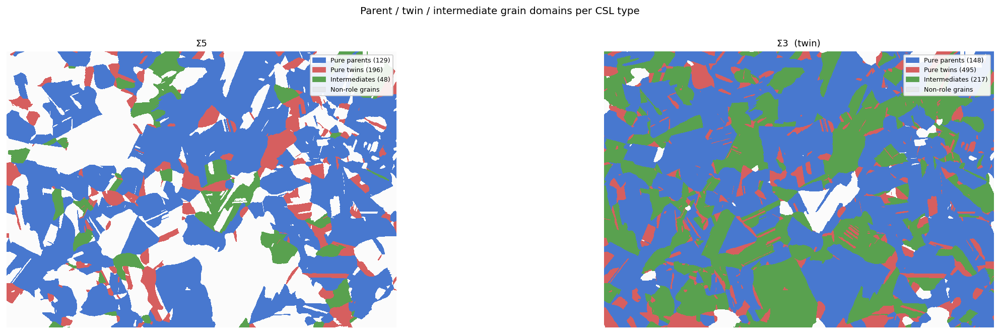

In [24]:
import importlib
import upxo.viz.ebsdviz as ebsdviz
importlib.reload(ebsdviz)
from upxo.viz.ebsdviz import plot_parent_twin_map

fig, axes = plot_parent_twin_map(
    rg.lfi_ebsd,
    parent_info,
    figsize=(10, 5),
    dpi=130,
    alpha_bg=0.10,
    suptitle='Parent / twin / intermediate grain domains per CSL type',
)


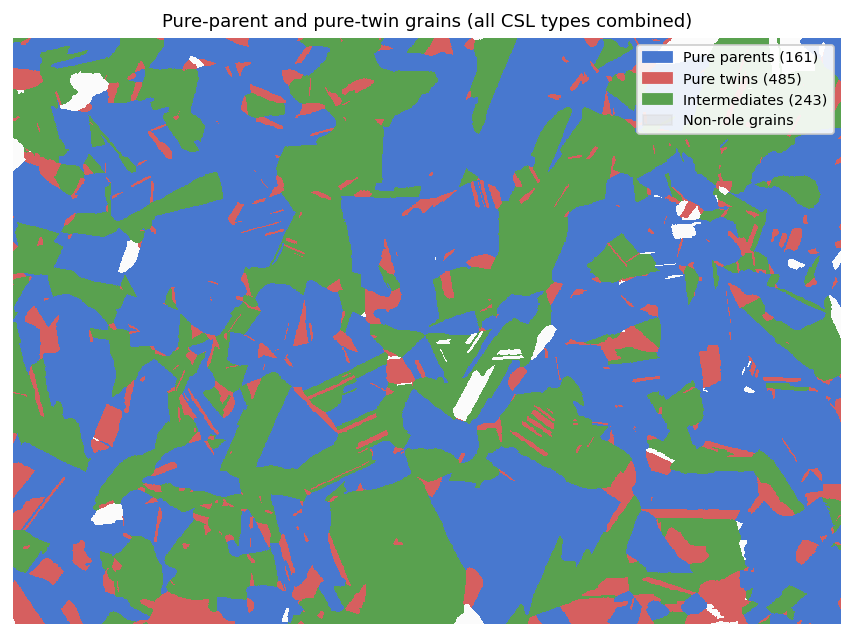

In [25]:
import importlib
import upxo.viz.ebsdviz as ebsdviz
importlib.reload(ebsdviz)
from upxo.viz.ebsdviz import plot_combined_parent_twin_map

fig, ax = plot_combined_parent_twin_map(
    rg.lfi_ebsd,
    parent_info,
    figsize=(10, 5),
    dpi=130,
    alpha_bg=0.08,
)


## 14. Property & topology statistics by grain role

Select which morphological / topological properties and grain-role groups to include in the analysis, then run the next cell.

In [26]:
import importlib
import upxo.viz.ebsdviz as ebsdviz
importlib.reload(ebsdviz)
from upxo.viz.ebsdviz import make_property_stats_widgets

_widgets = make_property_stats_widgets(default_ncols=0, default_fontsize=9.0)

Properties : ['area']
Groups     : ['pure_parents', 'pure_twins', 'intermediates', 'non_role']
ncols      : 2
fontsize   : 11.5


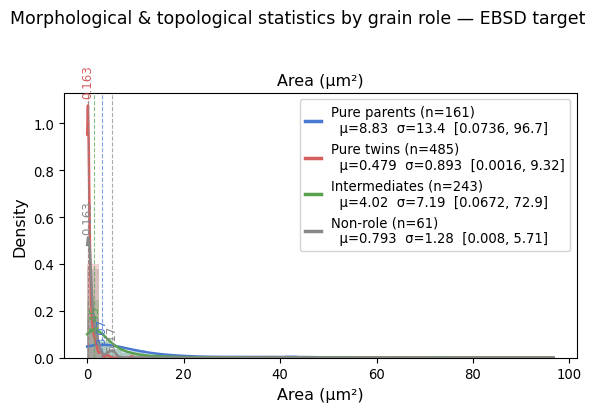

In [27]:
import importlib
import upxo.viz.ebsdviz as ebsdviz
importlib.reload(ebsdviz)
from upxo.viz.ebsdviz import plot_grain_role_property_stats, read_property_stats_widgets

w = read_property_stats_widgets(_widgets)
print(f'Properties : {w["selected_props"]}')
print(f'Groups     : {w["selected_groups"]}')
print(f'ncols      : {w["ncols"]}')
print(f'fontsize   : {w["fontsize"]}')

fig, axes = plot_grain_role_property_stats(
    lfi         = rg.lfi_ebsd,
    parent_info = parent_info,
    prop        = rg.prop_ebsd,
    neigh_gid   = rg.neigh_gid_ebsd,
    selected_props  = w['selected_props'],
    selected_groups = w['selected_groups'],
    step_size   = rdr.step_size,
    bins        = 40,
    bw_method   = 'scott',
    peak_prominence = 0.02,
    figsize_per = (6, 4),
    dpi         = 100,
    suptitle    = 'Morphological & topological statistics by grain role — EBSD target',
    ncols       = w['ncols'],
    fontsize    = w['fontsize'],
)

In [28]:
import importlib
import upxo.xtalphy.crystal_orientation as _co
import upxo.viz.ebsdviz as ebsdviz
importlib.reload(_co); importlib.reload(ebsdviz)
from upxo.xtalphy.crystal_orientation import compute_grain_role_ratios
from upxo.viz.ebsdviz import print_grain_role_ratios

ratios = compute_grain_role_ratios(rg.lfi_ebsd, parent_info)
print_grain_role_ratios(ratios)

Total indexed grains : 950

Role                  Count     Ratio   % of total
──────────────────────────────────────────────────
Pure parents            161    0.1695       16.95%
Pure twins              485    0.5105       51.05%
Intermediates           243    0.2558       25.58%
Non-role                 61    0.0642        6.42%
──────────────────────────────────────────────────
All role grains         889    0.9358       93.58%


Twin thickness statistics  [minor_axis_length, µm]
  Step size  : 0.2 µm/px
  N grains   : 770
  Mean       : 0.754 µm
  Median     : 0.445 µm
  Std dev    : 0.864 µm
  Min        : 0.050 µm
  Max        : 8.068 µm
  10th pct   : 0.121 µm
  90th pct   : 1.752 µm


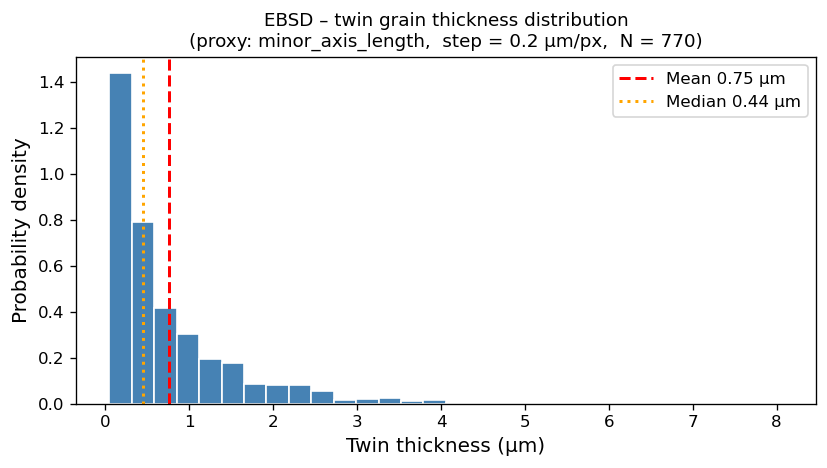

In [29]:
## Twin thickness statistics of experimental (EBSD) grain structure
import importlib
import upxo.xtalphy.crystal_orientation as _co
import upxo.viz.ebsdviz as ebsdviz
importlib.reload(_co); importlib.reload(ebsdviz)
from upxo.xtalphy.crystal_orientation import compute_twin_thickness_stats
from upxo.viz.ebsdviz import plot_twin_thickness_stats

twin_thickness_stats = compute_twin_thickness_stats(
    parent_info  = parent_info,
    prop_ebsd    = rg.prop_ebsd,
    step_size_um = rdr.step_size,
)

print(f"Twin thickness statistics  [{twin_thickness_stats['col']}, µm]")
print(f"  Step size  : {twin_thickness_stats['step_um']} µm/px")
print(f"  N grains   : {len(twin_thickness_stats['thick_um'])}")
print(f"  Mean       : {twin_thickness_stats['mean']:.3f} µm")
print(f"  Median     : {twin_thickness_stats['median']:.3f} µm")
print(f"  Std dev    : {twin_thickness_stats['std']:.3f} µm")
print(f"  Min        : {twin_thickness_stats['min']:.3f} µm")
print(f"  Max        : {twin_thickness_stats['max']:.3f} µm")
print(f"  10th pct   : {twin_thickness_stats['pct10']:.3f} µm")
print(f"  90th pct   : {twin_thickness_stats['pct90']:.3f} µm")

fig, ax = plot_twin_thickness_stats(twin_thickness_stats)
plt.show()

## 15. Assign grain roles to simulated structure `gs`

Grain roles (pure parent / pure twin / intermediate / non-role) are assigned to the simulated grain structure by matching the **role fractions** measured from the EBSD target.  
Grains are sorted by area (largest → pure parent, next tier → pure twin, etc.), reflecting the physical expectation that parent grains are larger than their twins.

In [30]:
import importlib
import upxo.xtalphy.crystal_orientation as _co
import upxo.viz.ebsdviz as ebsdviz
importlib.reload(_co); importlib.reload(ebsdviz)
from upxo.xtalphy.crystal_orientation import assign_grain_roles_by_ratio
from upxo.viz.ebsdviz import print_grain_role_ratios, plot_grain_role_map

# Build {grain_id: area} from gs.prop DataFrame
gs_grain_areas = dict(zip(gs.prop.index, gs.prop['area']))

# Assign roles to match EBSD target fractions (stored in `ratios`)
gs_roles = assign_grain_roles_by_ratio(gs.lfi, gs_grain_areas, ratios)

print('── Simulated gs — assigned role fractions ──')
print_grain_role_ratios(gs_roles)
print()
print('── EBSD target — reference fractions ──')
print_grain_role_ratios(ratios)

── Simulated gs — assigned role fractions ──
Total indexed grains : 1006

Role                  Count     Ratio   % of total
──────────────────────────────────────────────────
Pure parents            170    0.1690       16.90%
Pure twins              514    0.5109       51.09%
Intermediates           257    0.2555       25.55%
Non-role                 65    0.0646        6.46%
──────────────────────────────────────────────────
All role grains         941    0.9354       93.54%

── EBSD target — reference fractions ──
Total indexed grains : 950

Role                  Count     Ratio   % of total
──────────────────────────────────────────────────
Pure parents            161    0.1695       16.95%
Pure twins              485    0.5105       51.05%
Intermediates           243    0.2558       25.58%
Non-role                 61    0.0642        6.42%
──────────────────────────────────────────────────
All role grains         889    0.9358       93.58%


In [ ]:
fig, ax = plot_grain_role_map(
    gs.lfi,
    gs_roles,
    figsize=(10, 5),
    dpi=130,
    alpha_bg=0.08,
    suptitle='Simulated gs — grain roles assigned to match EBSD target fractions',
)

## Section 16 — CSL-based twin introduction in the simulated grain structure

Use the controls below to select a CSL boundary type and set twin geometry parameters.  
The pure-parent grains assigned in Section 15 will receive straight twin lamellae
generated by `Sline2d.by_LFAL` + `find_neigh_point_by_perp_distance`.

In [31]:
# ── Twin-introduction parameter widgets ─────────────────────────────────────
import ipywidgets as widgets
from IPython.display import display

_csl_options = list(selected_peaks.keys()) if selected_peaks else ['Σ3 (twin)']

_twin_widgets = {
    'csl_type': widgets.Dropdown(
        options=_csl_options,
        value=_csl_options[0],
        description='CSL type:',
        style={'description_width': '130px'},
    ),
    'twin_half_width': widgets.FloatSlider(
        value=2.0, min=1.0, max=10.0, step=0.5,
        description='Half-width (px):',
        style={'description_width': '130px'},
        layout=widgets.Layout(width='420px'),
    ),
    'width_perturb': widgets.FloatSlider(
        value=0.0, min=0.0, max=5.0, step=0.25,
        description='Width perturb (px):',
        style={'description_width': '130px'},
        layout=widgets.Layout(width='420px'),
    ),
    'n_twins': widgets.IntSlider(
        value=1, min=1, max=5, step=1,
        description='Twins / parent:',
        style={'description_width': '130px'},
        layout=widgets.Layout(width='420px'),
    ),
    'fixed_angle': widgets.FloatSlider(
        value=60.0, min=0.0, max=179.9, step=0.5,
        description='Twin angle (°):',
        style={'description_width': '130px'},
        layout=widgets.Layout(width='420px'),
    ),
    'angle_perturb': widgets.FloatSlider(
        value=0.0, min=0.0, max=15.0, step=0.5,
        description='Angle perturb (°):',
        style={'description_width': '130px'},
        layout=widgets.Layout(width='420px'),
    ),
    'random_angle': widgets.Checkbox(
        value=False,
        description='Random base angle per parent',
        indent=False,
    ),
    'rng_seed': widgets.IntText(
        value=42,
        description='RNG seed:',
        style={'description_width': '90px'},
        layout=widgets.Layout(width='220px'),
    ),
}

display(widgets.VBox([
    _twin_widgets['csl_type'],
    widgets.HTML('<b>Geometry</b>'),
    _twin_widgets['twin_half_width'],
    _twin_widgets['width_perturb'],
    _twin_widgets['n_twins'],
    widgets.HTML('<b>Orientation</b>'),
    _twin_widgets['fixed_angle'],
    _twin_widgets['angle_perturb'],
    _twin_widgets['random_angle'],
    widgets.HTML('<b>RNG</b>'),
    _twin_widgets['rng_seed'],
]))
print("Adjust parameters, then run the next cell.")


Adjust parameters, then run the next cell.


In [32]:

# ── Introduce twins ──────────────────────────────────────────────────────────
import importlib
import numpy as np
import upxo.geoEntities.sline2d as _sl_mod
import upxo.xtalphy.crystal_orientation as _co_mod
importlib.reload(_sl_mod)
importlib.reload(_co_mod)
from upxo.xtalphy.crystal_orientation import introduce_twins_by_csl

# Read widget values
_csl_sel        = _twin_widgets['csl_type'].value
_half_width     = float(_twin_widgets['twin_half_width'].value)
_width_perturb  = float(_twin_widgets['width_perturb'].value)
_n_twins        = int(_twin_widgets['n_twins'].value)
_random_angle   = bool(_twin_widgets['random_angle'].value)
_angle          = None if _random_angle else float(_twin_widgets['fixed_angle'].value)
_angle_perturb  = float(_twin_widgets['angle_perturb'].value)
_seed           = int(_twin_widgets['rng_seed'].value)

# ── Match experimental twinned-grain percentage ──────────────────────────────
# In the EBSD, ratios['pure_parents']['ratio'] is the fraction of grains
# that host a twin.  Apply the same fraction to the simulated structure.
ebsd_twin_fraction = ratios['pure_parents']['ratio']
n_sim_total        = gs.n
n_to_twin          = max(1, round(ebsd_twin_fraction * n_sim_total))

all_parents_sorted = sorted(gs_roles['pure_parents']['grain_ids'])
rng_sub            = np.random.default_rng(_seed)
parent_gids        = set(
    rng_sub.choice(all_parents_sorted,
                   size=min(n_to_twin, len(all_parents_sorted)),
                   replace=False).tolist()
)

print(f"EBSD pure-parent fraction  : {ebsd_twin_fraction:.3f}  "
      f"({ratios['pure_parents']['count']} / {ratios['total']['count']} grains)")
print(f"Sim total grains           : {n_sim_total}")
print(f"Sim grains to twin         : {len(parent_gids)} "
      f"({len(parent_gids)/n_sim_total:.3f}  ≈ target {ebsd_twin_fraction:.3f})")
print()

# Work on a copy of the label field so gs.lfi is preserved
lfi_before = gs.lfi.copy()
lfi_twin   = lfi_before.copy()

print(f"Introducing twins into {len(parent_gids)} parent grain(s).")
print(f"  CSL type       : {_csl_sel}")
print(f"  Half-width     : {_half_width} ± {_width_perturb} px")
print(f"  Twins/parent   : {_n_twins}")
print(f"  Angle          : {'random' if _random_angle else f'{_angle}°'} ± {_angle_perturb}°")
print(f"  RNG seed       : {_seed}")

twin_result = introduce_twins_by_csl(
    lfi=lfi_twin,
    parent_grain_ids=parent_gids,
    csl_label=_csl_sel,
    twin_half_width=_half_width,
    twin_angle_deg=_angle,
    n_twins_per_parent=_n_twins,
    angle_perturb_deg=_angle_perturb,
    width_perturb=_width_perturb,
    rng_seed=_seed,
)

total_new = sum(len(v) for v in twin_result['new_twin_gids'].values())
print(f"\nDone. {total_new} new twin grain(s) created.")
print(f"Label field: {lfi_before.max()} → {twin_result['lfi'].max()} (max grain ID)")


EBSD pure-parent fraction  : 0.169  (161 / 950 grains)
Sim total grains           : 1006
Sim grains to twin         : 170 (0.169  ≈ target 0.169)

Introducing twins into 170 parent grain(s).
  CSL type       : angles
  Half-width     : 4.5 ± 1.0 px
  Twins/parent   : 3
  Angle          : random ± 0.0°
  RNG seed       : 42

Done. 209 new twin grain(s) created.
Label field: 1006 → 1215 (max grain ID)


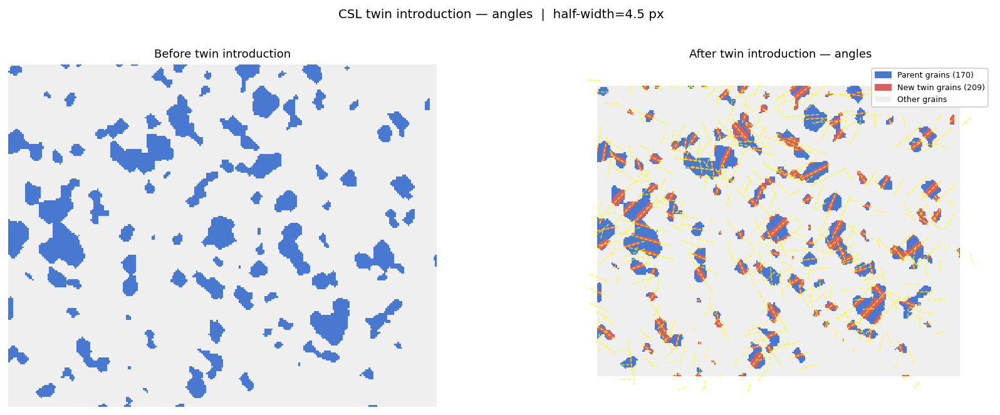

In [33]:
# ── Visualise before / after ─────────────────────────────────────────────────
import importlib
import upxo.viz.ebsdviz as _ev_mod
importlib.reload(_ev_mod)
from upxo.viz.ebsdviz import plot_twin_introduction_map

fig, axes = plot_twin_introduction_map(
    lfi_before=lfi_before,
    twin_result=twin_result,
    figsize=(14, 5),
    dpi=130,
    color_parent='#4878CF',
    color_twin='#D65F5F',
    color_other='#CCCCCC',
    alpha_other=0.30,
    show_cut_lines=True,
    suptitle=f'CSL twin introduction — {_csl_sel}  |  half-width={_half_width} px',
)


In [34]:
# ── Verify that lfi_twin actually differs from lfi_before ───────────────────
import numpy as np

lfi_after = twin_result['lfi']

changed_mask  = lfi_before != lfi_after
n_changed     = changed_mask.sum()
n_total       = lfi_before.size
pct_changed   = 100.0 * n_changed / n_total

new_ids_in_after = set(np.unique(lfi_after)) - set(np.unique(lfi_before))

print(f"Pixels changed  : {n_changed:,} / {n_total:,}  ({pct_changed:.2f} %)")
print(f"New grain IDs   : {len(new_ids_in_after)}  (IDs {min(new_ids_in_after) if new_ids_in_after else 'n/a'}"
      f" – {max(new_ids_in_after) if new_ids_in_after else 'n/a'})")
print(f"lfi_before max  : {lfi_before.max()}")
print(f"lfi_after  max  : {lfi_after.max()}")
print(f"Arrays are identical: {np.array_equal(lfi_before, lfi_after)}")


Pixels changed  : 3,515 / 50,451  (6.97 %)
New grain IDs   : 209  (IDs 1007 – 1215)
lfi_before max  : 1006
lfi_after  max  : 1215
Arrays are identical: False


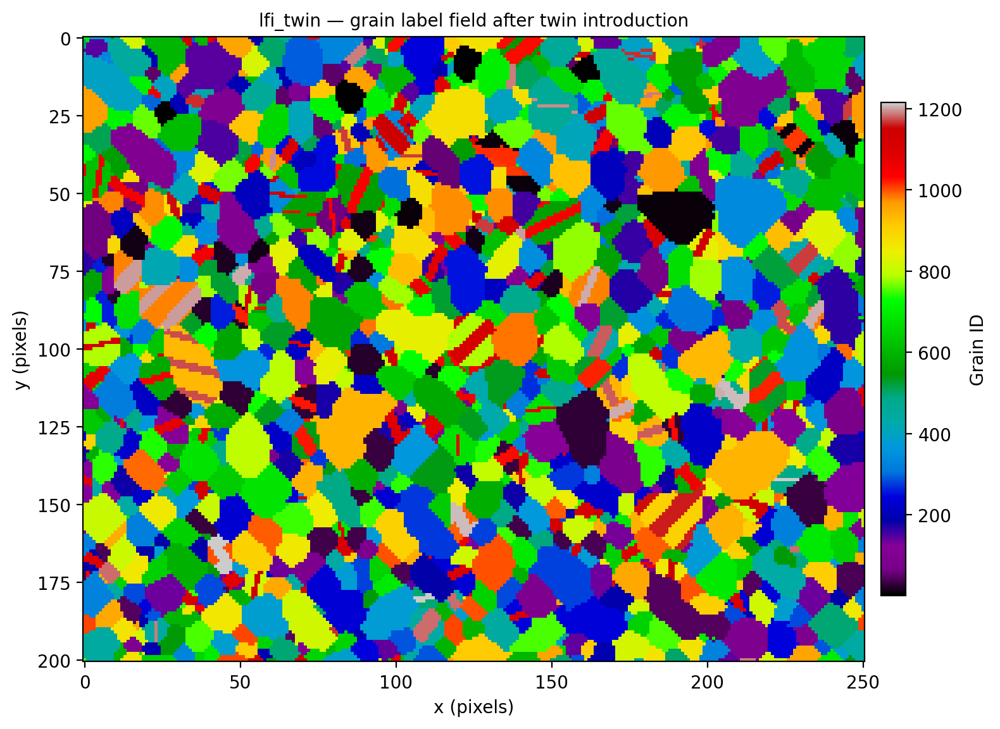

In [35]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 8), dpi=200)
im = ax.imshow(lfi_after, interpolation='nearest', aspect='equal', cmap='nipy_spectral')
plt.colorbar(im, ax=ax, fraction=0.03, pad=0.02, label='Grain ID')
ax.set_title('lfi_twin — grain label field after twin introduction', fontsize=10)
ax.set_xlabel('x (pixels)')
ax.set_ylabel('y (pixels)')
plt.tight_layout()
plt.show()


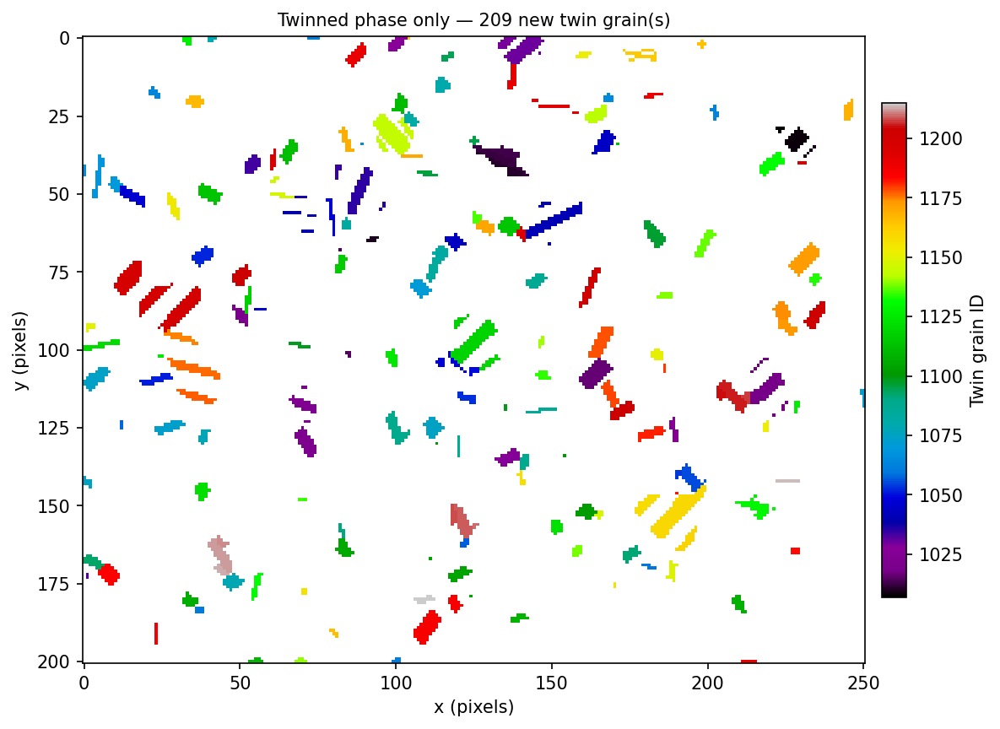

Twin pixels        : 3515  (6.97 % of map)


In [36]:
# ── Plot twinned phase only ──────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt

lfi_after        = twin_result['lfi']
new_ids_in_after = sorted(set(np.unique(lfi_after)) - set(np.unique(lfi_before)))

# Pixels belonging to new twin grains; all others → NaN (transparent)
twin_only = np.where(np.isin(lfi_after, new_ids_in_after),
                     lfi_after.astype(float), np.nan)

fig, ax = plt.subplots(figsize=(8, 8), dpi=150)
ax.imshow(np.ones_like(lfi_after), cmap='gray', vmin=0, vmax=1,
          interpolation='nearest', aspect='equal')          # white background
im = ax.imshow(twin_only, cmap='nipy_spectral',
               interpolation='nearest', aspect='equal',
               vmin=lfi_before.max() + 1, vmax=lfi_after.max())
plt.colorbar(im, ax=ax, fraction=0.03, pad=0.02, label='Twin grain ID')
ax.set_title(f'Twinned phase only — {len(new_ids_in_after)} new twin grain(s)', fontsize=10)
ax.set_xlabel('x (pixels)')
ax.set_ylabel('y (pixels)')
plt.tight_layout()
plt.show()

# print(f'New twin grain IDs : {new_ids_in_after}')
print(f'Twin pixels        : {int(np.isfinite(twin_only).sum())}  '
      f'({100.0 * np.isfinite(twin_only).sum() / lfi_after.size:.2f} % of map)')


## Section 17 — Orientation assignment to match EBSD MDF

Assign crystallographic orientations (quaternions) to every domain in the
twinned simulated grain structure (`lfi_after`) so that the grain-boundary
Misorientation Distribution Function (MDF) of the simulation matches the
EBSD target.

**Strategy**
| Grain role | Orientation source |
|---|---|
| Pure-parent sim grains | Sampled from EBSD pure-parent pool |
| Introduced (geometric) twin grains | `q_twin = Σ3_Q ⊗ q_parent` (60°/⟨111⟩) |
| Pre-labelled pure-twin sim grains | Sampled from EBSD pure-twin pool |
| Intermediate sim grains | Sampled from EBSD intermediate pool |
| Non-role sim grains | Sampled from EBSD non-role pool |

In [37]:
import importlib, upxo.xtalphy.crystal_orientation as _co
importlib.reload(_co)
from upxo.xtalphy.crystal_orientation import assign_orientations_mdf_matched

ori_result = assign_orientations_mdf_matched(
    lfi_after      = lfi_after,
    gs_roles       = gs_roles,
    twin_result    = twin_result,
    ebsd_lfi       = rg.lfi_ebsd,
    ebsd_quat      = rg.quat_ebsd,
    ebsd_parent_info = parent_info,
    rng_seed       = 42,
)
print('Assigned orientations to', len(ori_result['grain_quats']), 'sim grains')
print('quat_pixel shape :', ori_result['quat_pixel'].shape)
print('Neighbour-graph entries:', len(ori_result['neigh_gid_sim']))

Assigned orientations to 1215 sim grains
quat_pixel shape : (201, 251, 4)
Neighbour-graph entries: 1189


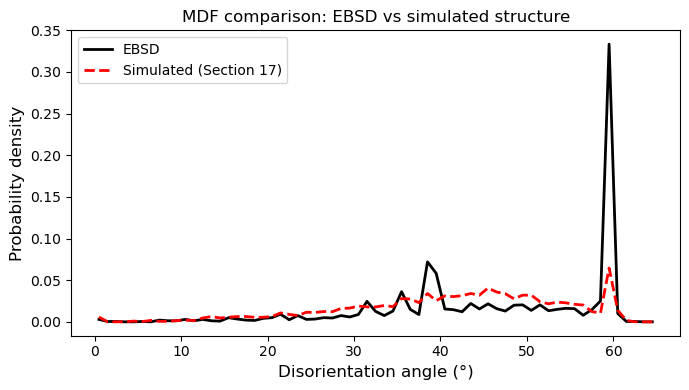

EBSD   mean disorientation: 47.18°  ±12.86°
Sim    mean disorientation: 41.63°  ±12.32°


In [38]:
from upxo.xtalphy.crystal_orientation import compute_mdf_from_quats
import matplotlib.pyplot as plt
import numpy as np

# MDF of simulated structure
mdf_sim = compute_mdf_from_quats(
    lfi       = lfi_after,
    quat      = ori_result['quat_pixel'],
    neigh_gid = ori_result['neigh_gid_sim'],
)

# Overlay comparison: EBSD vs sim MDF
fig, ax = plt.subplots(figsize=(7, 4))
ax.plot(mdf['hist_bin_centers'],     mdf['hist_density'],     'k-',  lw=2, label='EBSD')
ax.plot(mdf_sim['hist_bin_centers'], mdf_sim['hist_density'], 'r--', lw=2, label='Simulated (Section 17)')
ax.set_xlabel('Disorientation angle (°)', fontsize=12)
ax.set_ylabel('Probability density',      fontsize=12)
ax.set_title('MDF comparison: EBSD vs simulated structure')
ax.legend()
fig.tight_layout()
plt.show()

print(f"EBSD   mean disorientation: {mdf['mean_angle']:.2f}°  ±{mdf['std_angle']:.2f}°")
print(f"Sim    mean disorientation: {mdf_sim['mean_angle']:.2f}°  ±{mdf_sim['std_angle']:.2f}°")

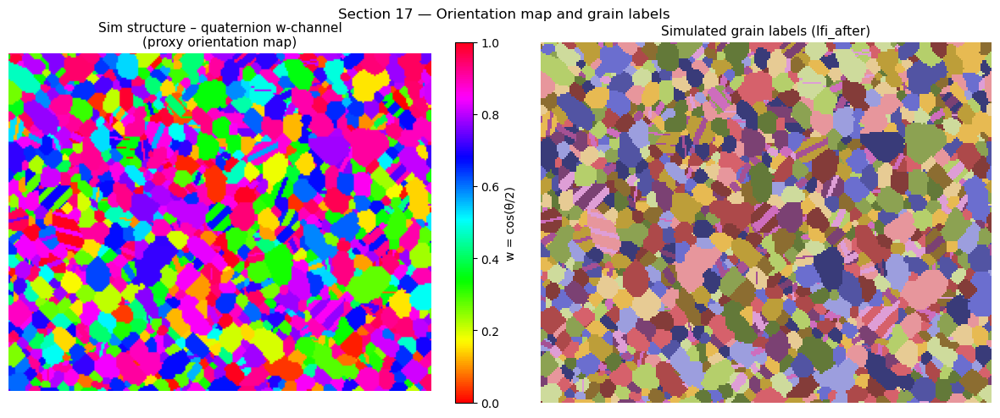

Total sim grains with assigned orientation : 1215
  of which geometrically-introduced twins  : 209
  CSL label used for twin introduction     : angles


In [39]:
import matplotlib.pyplot as plt
import numpy as np

# Visualise the w-component of the per-pixel quaternion map as a proxy
# orientation map.  w = cos(θ/2), so this image encodes the half-angle
# of the rotation and gives a visually distinct colour per orientation family.
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Simulated structure: w-channel
ax = axes[0]
im0 = ax.imshow(ori_result['quat_pixel'][..., 0], cmap='hsv', origin='upper',
                vmin=0, vmax=1)
ax.set_title('Sim structure – quaternion w-channel\n(proxy orientation map)', fontsize=11)
ax.axis('off')
plt.colorbar(im0, ax=ax, fraction=0.046, label='w = cos(θ/2)')

# Show label field with twin outlines for reference
ax2 = axes[1]
ax2.imshow(lfi_after, cmap='tab20b', origin='upper', interpolation='nearest')
ax2.set_title('Simulated grain labels (lfi_after)', fontsize=11)
ax2.axis('off')

fig.suptitle('Section 17 — Orientation map and grain labels', fontsize=12)
fig.tight_layout()
plt.show()

# --- Summary statistics ---
n_intro_twins = sum(len(v) for v in twin_result.get('new_twin_gids', {}).values())
print(f"Total sim grains with assigned orientation : {len(ori_result['grain_quats'])}")
print(f"  of which geometrically-introduced twins  : {n_intro_twins}")
print(f"  CSL label used for twin introduction     : {twin_result.get('csl_label', 'N/A')}")

─── Grain-size matching scale factor ───────────────────────────────
  EBSD mean grain area         : 70.521 µm²  (step = 0.2 µm/px,  N = 950 grains)
  Synthetic mean grain area    : 42.4 px²  (N = 1189 grains in lfi_after)

  Scale factor                 : 1.28919  µm / sim-pixel
  Sim pixel size (scaled)      : 1.28919 µm
  EBSD step size               : 0.2000 µm
  Ratio (sim/EBSD pixel size)  : 6.4459

  Synthetic domain size        : 251 × 201 px
  Scaled physical domain size  : 323.6 × 259.1 µm

  Sim mean area after scaling  : 70.521 µm²  (target: 70.521 µm²)  ✓


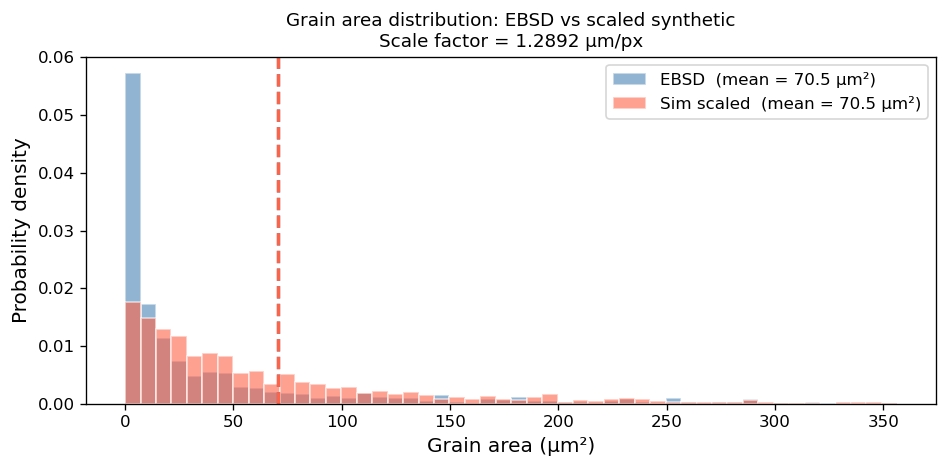

In [40]:
## Scale factor: match synthetic mean grain size to EBSD mean grain size
import importlib
import upxo.xtalphy.crystal_orientation as _co
import upxo.viz.ebsdviz as ebsdviz
importlib.reload(_co); importlib.reload(ebsdviz)
from upxo.xtalphy.crystal_orientation import compute_scale_factor_grain_size
from upxo.viz.ebsdviz import plot_grain_area_comparison

scale_result = compute_scale_factor_grain_size(
    lfi_sim            = lfi_after,
    mean_area_ebsd_um2 = rg.stat_ebsd['area']['mean'],
    ebsd_step_size_um  = rdr.step_size,
    prop_ebsd          = rg.prop_ebsd,
)

print("─── Grain-size matching scale factor ───────────────────────────────")
print(f"  EBSD mean grain area         : {scale_result['mean_area_ebsd_um2']:.3f} µm²"
      f"  (step = {scale_result['ebsd_step_size_um']} µm/px,"
      f"  N = {rg.stat_ebsd['area']['count']} grains)")
print(f"  Synthetic mean grain area    : {scale_result['mean_area_sim_px2']:.1f} px²"
      f"  (N = {len(scale_result['gids_sim'])} grains in lfi_after)")
print()
print(f"  Scale factor                 : {scale_result['scale_factor']:.5f}  µm / sim-pixel")
print(f"  Sim pixel size (scaled)      : {scale_result['scale_factor']:.5f} µm")
print(f"  EBSD step size               : {scale_result['ebsd_step_size_um']:.4f} µm")
print(f"  Ratio (sim/EBSD pixel size)  : {scale_result['ratio_pixel_sizes']:.4f}")
print()
print(f"  Synthetic domain size        : {scale_result['sim_domain_px'][1]} × {scale_result['sim_domain_px'][0]} px")
print(f"  Scaled physical domain size  : {scale_result['sim_domain_um'][1]:.1f} × {scale_result['sim_domain_um'][0]:.1f} µm")
print()
match = abs(scale_result['mean_area_sim_um2'] - scale_result['mean_area_ebsd_um2']) < 1e-6
print(f"  Sim mean area after scaling  : {scale_result['mean_area_sim_um2']:.3f} µm²"
      f"  (target: {scale_result['mean_area_ebsd_um2']:.3f} µm²)"
      + ("  ✓" if match else ""))

fig, ax = plot_grain_area_comparison(scale_result)
plt.show()

# Generating smoothed grain structure

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from upxo.pxtal.geometrification import GrainManifold2D
import upxo.gsdataops.grid_ops as gridOps
from upxo.viz import gsviz
from upxo.ggrowth.mcgs import mcgs
from copy import deepcopy
import cc3d

In [42]:
lfi = lfi_after.copy()  # work on a copy to preserve original
plt.imshow(lfi)

In [43]:
from upxo.gsdataops.gid_ops import find_neighs2d
neigh_gid = find_neighs2d(lfi, conn=4)

In [44]:
areas = np.bincount(lfi.ravel())[1:]
areas

array([80, 52, 80, ..., 10,  8, 12], shape=(1215,))

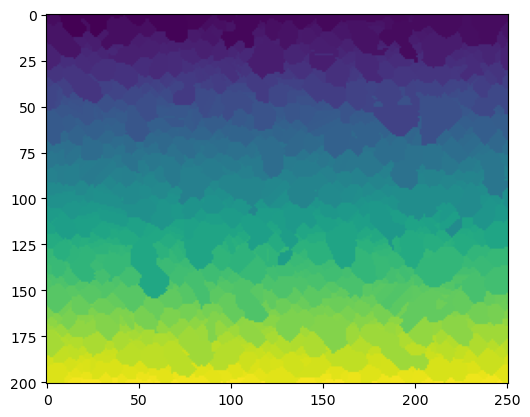

In [45]:
def merge_small_grains(neigh_gid, areas, lfi, athreshold=1):
    """
    Merge small grains with their dominant (largest) neighboring grain.
    Recomputes connected components and updates neighbor/area data after each merger.
    
    Parameters
    ----------
    neigh_gid : dict
        Dictionary mapping grain IDs to arrays of neighboring grain IDs
    areas : np.ndarray
        Array of grain areas (pixel counts), indexed by grain ID (starting from 1)
    lfi : np.ndarray
        Label field image (2D array of grain IDs)
    athreshold : int
        Area threshold for identifying small grains
    
    Returns
    -------
    lfi_merged : np.ndarray
        Updated label field image with small grains merged
    """
    def find_dominant_neighbor(gid, neigh_gid, areas):
        """Find the dominant (largest area) neighbor for a grain."""
        if gid in neigh_gid and len(neigh_gid[gid]) > 0:
            neighbors = neigh_gid[gid]
            neighbor_areas = areas[neighbors - 1]
            return neighbors[np.argmax(neighbor_areas)]
        return gid
    lfi_merged = deepcopy(lfi)
    # Identify and merge small grains
    small_grains = np.where(areas <= athreshold)[0] + 1
    for gid in small_grains:
        dominant = find_dominant_neighbor(gid, neigh_gid, areas)
        lfi_merged[lfi_merged == gid] = dominant
        lfi_merged = cc3d.connected_components(lfi_merged, connectivity=4)
        # Update neighbor and area data after merger
        neigh_gid = find_neighs2d(lfi_merged, conn=4)
        areas = np.bincount(lfi_merged.ravel())[1:]
    return lfi_merged

lfi_merged = merge_small_grains(neigh_gid, areas, lfi, athreshold=1)
plt.imshow(lfi_merged)

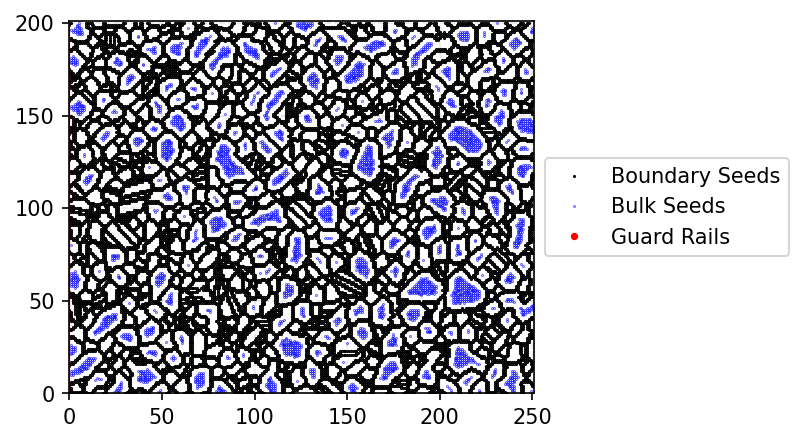

In [46]:
seeds = gridOps.generate_constrained_hybrid_seeds(lfi, target_spacing=1.0, bulk_spacing=1.0, jitter_factor=0.25, margin=0.5, padding=2.0, plot_seeds=True, figsize=(5, 5), dpi=150, markersize=0.5)

In [47]:
manifold_structure = GrainManifold2D.by_tessellation(lfi, seeds)

In [48]:
original_cells = {gid: geom for gid, geom in manifold_structure.cells.items()}

(<Figure size 1200x600 with 1 Axes>, [<Axes: title={'center': 'Subplot 1'}>])

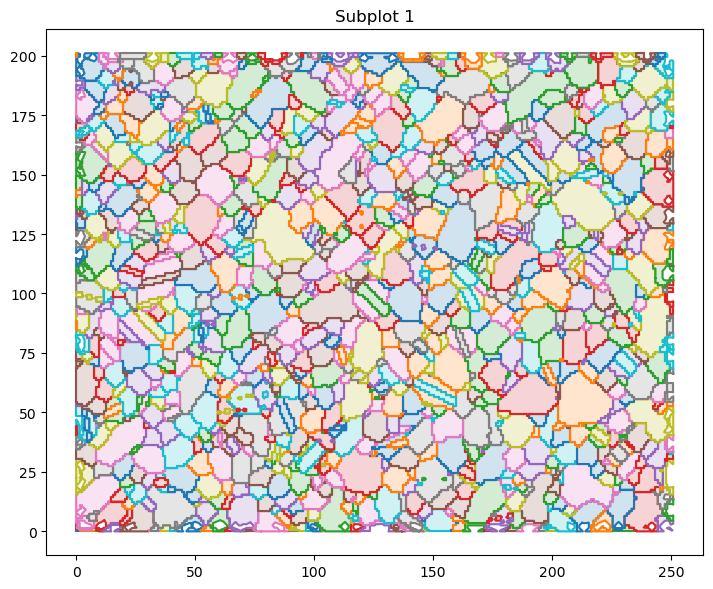

In [49]:
gsviz.plot_manifold_geom([original_cells], figsize=(12, 6), dpi=100, inlude_legend=False)

In [50]:
manifold_structure.smooth_interfaces(iterations=10, lmbda=0.5, mu=-0.53)

In [51]:
gsviz.plot_manifold_geom([original_cells, manifold_structure.cells], figsize=(12, 6), dpi=100, inlude_legend=False)

(<Figure size 1200x600 with 2 Axes>,
 array([<Axes: title={'center': 'Subplot 1'}>,
        <Axes: title={'center': 'Subplot 2'}>], dtype=object))

In [52]:
_ = manifold_structure.trim_to_rve(bounds=(15, 15, 230, 175))

(<Figure size 2400x1200 with 2 Axes>,
 array([<Axes: title={'center': 'Subplot 1'}>,
        <Axes: title={'center': 'Subplot 2'}>], dtype=object))

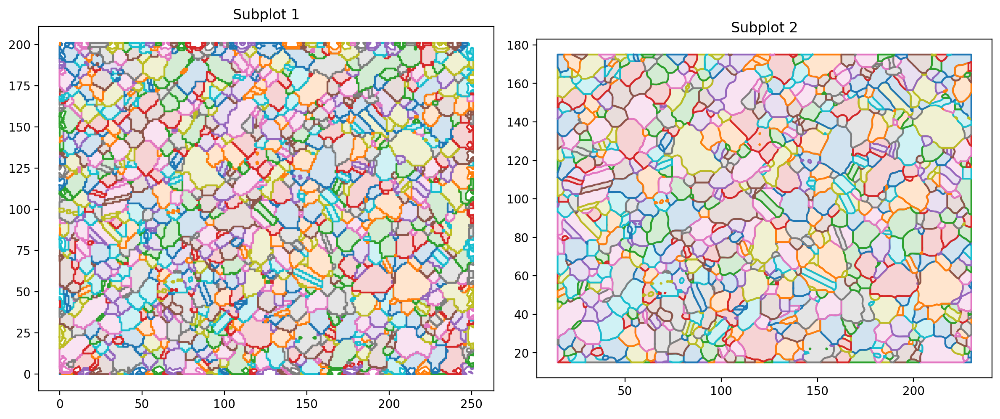

In [53]:
gsviz.plot_manifold_geom([original_cells, manifold_structure.cells], figsize=(12, 6), dpi=200, inlude_legend=False)

In [54]:
from shapely.geometry import MultiPolygon

In [55]:
"""Remove empty/invalid polygons and reconstruct the dictionary"""
cleaned_cells = {}
for gid, geom in manifold_structure.cells.items():
    """Check if geometry is valid and has non-zero area"""
    if geom is not None and geom.is_valid and geom.area > 0:
        cleaned_cells[gid] = geom
"""Update the manifold structure with cleaned cells"""
manifold_structure.cells = cleaned_cells

print(f"Removed {len(manifold_structure.cells) - len(cleaned_cells)} empty/invalid polygons")
print(f"Remaining polygons: {len(cleaned_cells)}")
manifold_structure.cells

Removed 0 empty/invalid polygons
Remaining polygons: 841


{292: <POLYGON ((70.539 15.461, 71.448 15.552, 72.5 15.5, 73.458 15.458, 74.229 15...>,
 247: <POLYGON ((107.283 15.717, 107.511 16.489, 107.558 17.442, 107.5 18.5, 108.5...>,
 145: <POLYGON ((29.5 16.5, 29.5 17.5, 30.165 17.835, 30.74 18.26, 31.26 18.74, 31...>,
 605: <POLYGON ((226.5 15.5, 227.217 15.783, 227.807 16.193, 228.217 16.783, 228.5...>,
 700: <POLYGON ((126.5 16.5, 126.835 17.165, 127.26 17.74, 127.74 18.26, 128.165 1...>,
 456: <POLYGON ((166.833 16.167, 167.167 16.833, 167.5 17.5, 168.217 17.783, 168.8...>,
 552: <POLYGON ((190.27 15.712, 190.769 16.236, 191.345 16.764, 191.925 17.288, 19...>,
 395: <POLYGON ((15.823 23.823, 16.213 23.213, 16.681 22.681, 17.213 22.213, 17.82...>,
 505: <POLYGON ((139.119 15.881, 139.772 16.228, 140.531 16.469, 141.453 16.547, 1...>,
 50: <POLYGON ((79.542 15.458, 80.5 15.5, 81.165 15.165, 81.389 15, 78.482 15, 78...>,
 607: <POLYGON ((96.5 16.5, 96.818 17.182, 97.119 17.881, 97.453 18.547, 97.913 19...>,
 1191: <POLYGON ((135.5 16.5, 136

(<Figure size 1800x900 with 1 Axes>, [<Axes: title={'center': 'Subplot 1'}>])

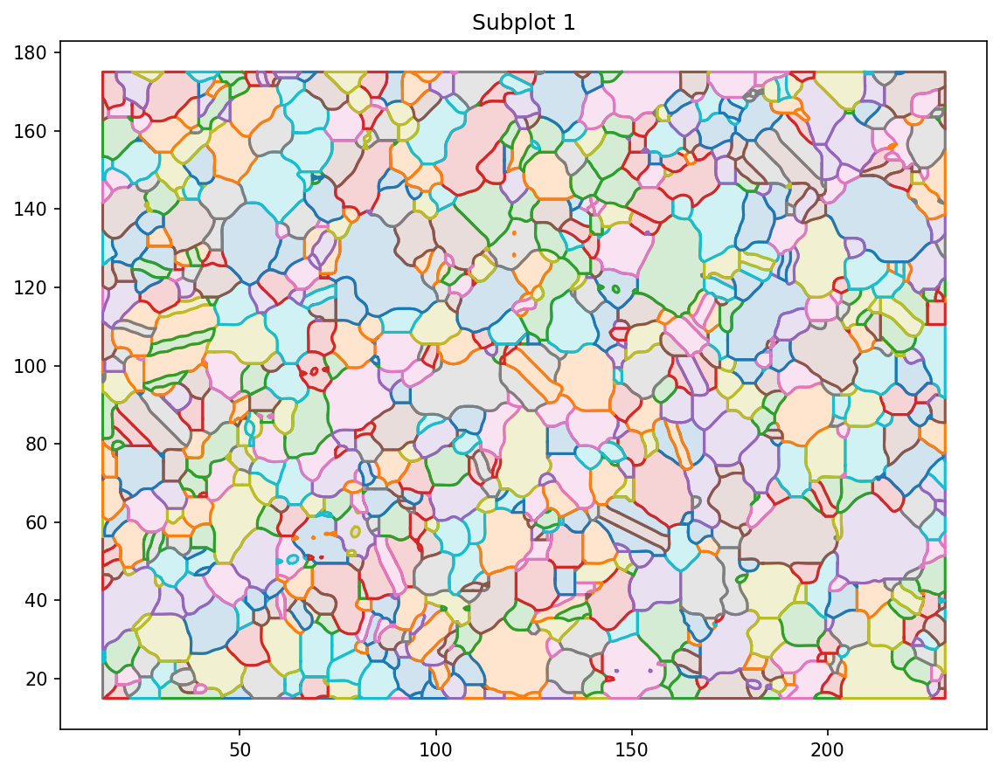

In [56]:
gsviz.plot_manifold_geom([manifold_structure.cells], figsize=(12, 6), dpi=150, inlude_legend=False)

In [57]:
from collections import Counter
"""Construct neighbor dictionary for all polygons with integer GIDs starting from 1"""
polygon_neighbors = {}
"""Get list of GIDs and ensure they're integers in sorted order"""
gids = sorted([int(gid) for gid in manifold_structure.cells.keys()])
"""For each polygon, find all neighbors (polygons that touch it)"""
for gid1 in gids:
    polygon_neighbors[gid1] = []
    geom1 = manifold_structure.cells[gid1]
    """Compare with all other polygons"""
    for gid2 in gids:
        if gid1 != gid2:
            geom2 = manifold_structure.cells[gid2]
            """Check if polygons touch (share boundary but don't overlap)"""
            if geom1.touches(geom2):
                polygon_neighbors[gid1].append(gid2)
# Summary
print(f"Total polygons: {len(polygon_neighbors)}")
print(f"\nNeighbor statistics:")
neighbor_counts = [len(neighs) for neighs in polygon_neighbors.values()]
print(f"  Min neighbors: {min(neighbor_counts)}")
print(f"  Max neighbors: {max(neighbor_counts)}")
print(f"  Avg neighbors: {sum(neighbor_counts) / len(neighbor_counts):.2f}")
# grain_ids, neigh_id = find_neighs()
neigh_dist = Counter(neighbor_counts)
print(f"\nNeighbor count distribution:")
for n_neighs in sorted(neigh_dist.keys()):
    count = neigh_dist[n_neighs]
    print(f"  {n_neighs} neighbors: {count} polygons")

print(f"\nSample neighbors:")
for gid in list(polygon_neighbors.keys())[:5]:
    print(f"  GID {gid}: {polygon_neighbors[gid]}")

Total polygons: 841

Neighbor statistics:
  Min neighbors: 1
  Max neighbors: 18
  Avg neighbors: 6.15

Neighbor count distribution:
  1 neighbors: 2 polygons
  2 neighbors: 23 polygons
  3 neighbors: 89 polygons
  4 neighbors: 128 polygons
  5 neighbors: 128 polygons
  6 neighbors: 141 polygons
  7 neighbors: 126 polygons
  8 neighbors: 69 polygons
  9 neighbors: 53 polygons
  10 neighbors: 38 polygons
  11 neighbors: 14 polygons
  12 neighbors: 9 polygons
  13 neighbors: 4 polygons
  14 neighbors: 7 polygons
  15 neighbors: 5 polygons
  16 neighbors: 3 polygons
  17 neighbors: 1 polygons
  18 neighbors: 1 polygons

Sample neighbors:
  GID 3: [50, 297, 707, 708, 826, 914, 960]
  GID 5: [201, 296, 401, 611, 761]
  GID 7: [511, 558, 662, 918, 973, 1007, 1008]
  GID 8: [157, 205, 337, 412, 508, 763, 769, 876, 879, 977, 1011, 1012, 1013, 1095]
  GID 9: [102, 154, 340, 345, 415, 518, 616, 670, 770, 772, 836, 925, 972, 1097, 1137]


In [58]:
"""manifold_structure.cells key renumbering to start from 1 contiguously"""
old_to_new_gid = {}
new_cells = {}
"""Debug: Check GIDs in both dictionaries"""
cells_gids = set(manifold_structure.cells.keys())
neighbors_gids = set(polygon_neighbors.keys())
all_neighbor_refs = set()
for neighbors in polygon_neighbors.values():
    all_neighbor_refs.update(neighbors)

print(f"Debug - GIDs in manifold_structure.cells: {len(cells_gids)}")
print(f"Debug - GIDs in polygon_neighbors keys: {len(neighbors_gids)}")
print(f"Debug - All neighbor GID references: {len(all_neighbor_refs)}")

"""Check for mismatches"""
missing_in_cells = all_neighbor_refs - cells_gids
missing_in_neighbors = cells_gids - neighbors_gids
if missing_in_cells:
    print(f"Warning: Neighbor references point to missing cells: {missing_in_cells}")
    print(f"Filtering polygon_neighbors to only include cells in manifold_structure.cells")
    # Filter polygon_neighbors to only include cells that exist
    polygon_neighbors = {gid: neighbors for gid, neighbors in polygon_neighbors.items() if gid in cells_gids}
    
if missing_in_neighbors:
    print(f"Warning: Cells missing from polygon_neighbors: {missing_in_neighbors}")

for new_gid, old_gid in enumerate(sorted(manifold_structure.cells.keys()), start=1):
    old_to_new_gid[old_gid] = new_gid
    new_cells[new_gid] = manifold_structure.cells[old_gid]
manifold_structure.cells = new_cells

"""Update polygon_neighbors with new GID mapping"""
polygon_neighbors_renumbered = {}
for old_gid, neighbors in polygon_neighbors.items():
    new_gid = old_to_new_gid[old_gid]
    new_neighbors = [old_to_new_gid[n] for n in neighbors if n in old_to_new_gid]
    polygon_neighbors_renumbered[new_gid] = new_neighbors
polygon_neighbors = polygon_neighbors_renumbered

print(f"\nRenumbered {len(old_to_new_gid)} grain cells to contiguous IDs from 1 to {len(new_cells)}")
print(f"Sample mapping (old -> new): {dict(list(old_to_new_gid.items())[:5])}")

Debug - GIDs in manifold_structure.cells: 841
Debug - GIDs in polygon_neighbors keys: 841
Debug - All neighbor GID references: 841

Renumbered 841 grain cells to contiguous IDs from 1 to 841
Sample mapping (old -> new): {3: 1, 5: 2, 7: 3, 8: 4, 9: 5}


In [59]:
"""Validation check for all polygons in manifold_structure.cells"""
from shapely.geometry import Polygon

validity_report = {}
for gid, geom in manifold_structure.cells.items():
    is_valid = geom.is_valid if geom is not None else False
    is_polygon = isinstance(geom, Polygon) if geom is not None else False
    has_area = geom.area > 0 if geom is not None else False
    validity_report[gid] = {'is_valid': is_valid, 'has_area': has_area, 'is_polygon': is_polygon, 'area': geom.area if geom is not None else 0}

"""Summary"""
print(f"Total polygons: {len(validity_report)}")
valid_count = sum(1 for v in validity_report.values() if v['is_valid'])
area_count = sum(1 for v in validity_report.values() if v['has_area'])
polygon_count = sum(1 for v in validity_report.values() if v['is_polygon'])

print(f"Valid polygons: {valid_count}")
print(f"Polygons with area: {area_count}")
print(f"Polygon type objects: {polygon_count}")

print(f"\nInvalid polygons:")
invalid_polys = {gid: v for gid, v in validity_report.items() if not v['is_valid']}
if invalid_polys:
    for gid, vals in invalid_polys.items():
        print(f"  GID {gid}: {vals}")
else:
    print("  None - all polygons are valid!")

Total polygons: 841
Valid polygons: 841
Polygons with area: 841
Polygon type objects: 708

Invalid polygons:
  None - all polygons are valid!


In [60]:
"""Ensure manifold_structure.cells has integer keys starting from 1"""
cells_int = {int(gid) if isinstance(gid, str) else gid: geom 
             for gid, geom in manifold_structure.cells.items()}
manifold_structure.cells = cells_int
"""Construct neighbor dictionary for all polygons with integer GIDs starting from 1"""
polygon_neighbors = {}
"""Get list of GIDs and ensure they're integers in sorted order"""
gids = sorted([int(gid) for gid in manifold_structure.cells.keys()])
"""For each polygon, find all neighbors (polygons that touch it)"""
for gid1 in gids:
    polygon_neighbors[gid1] = []
    geom1 = manifold_structure.cells[gid1]
    """Compare with all other polygons"""
    for gid2 in gids:
        if gid1 != gid2:
            geom2 = manifold_structure.cells[gid2]
            """Check if polygons touch (share boundary but don't overlap)"""
            if geom1.touches(geom2):
                polygon_neighbors[gid1].append(gid2)

print(f"Total polygons: {len(polygon_neighbors)}")
print(f"\nNeighbor statistics:")
neighbor_counts = [len(neighs) for neighs in polygon_neighbors.values()]
print(f"  Min neighbors: {min(neighbor_counts)}")
print(f"  Max neighbors: {max(neighbor_counts)}")
print(f"  Avg neighbors: {sum(neighbor_counts) / len(neighbor_counts):.2f}")

"""Show polygons by neighbor count"""
from collections import Counter
neigh_dist = Counter(neighbor_counts)
print(f"\nNeighbor count distribution:")
for n_neighs in sorted(neigh_dist.keys()):
    count = neigh_dist[n_neighs]
    print(f"  {n_neighs} neighbors: {count} polygons")

print(f"\nSample neighbors:")
for gid in list(polygon_neighbors.keys())[:5]:
    print(f"  GID {gid}: {polygon_neighbors[gid]}")

Total polygons: 841

Neighbor statistics:
  Min neighbors: 1
  Max neighbors: 18
  Avg neighbors: 6.15

Neighbor count distribution:
  1 neighbors: 2 polygons
  2 neighbors: 23 polygons
  3 neighbors: 89 polygons
  4 neighbors: 128 polygons
  5 neighbors: 128 polygons
  6 neighbors: 141 polygons
  7 neighbors: 126 polygons
  8 neighbors: 69 polygons
  9 neighbors: 53 polygons
  10 neighbors: 38 polygons
  11 neighbors: 14 polygons
  12 neighbors: 9 polygons
  13 neighbors: 4 polygons
  14 neighbors: 7 polygons
  15 neighbors: 5 polygons
  16 neighbors: 3 polygons
  17 neighbors: 1 polygons
  18 neighbors: 1 polygons

Sample neighbors:
  GID 1: [37, 204, 474, 475, 558, 615, 647]
  GID 2: [135, 203, 264, 406, 513]
  GID 3: [338, 372, 440, 619, 656, 680, 681]
  GID 4: [110, 138, 229, 273, 336, 515, 520, 590, 593, 660, 683, 684, 685, 748]
  GID 5: [71, 107, 232, 236, 276, 343, 408, 447, 521, 523, 565, 625, 655, 750, 782]


In [61]:
polygon_neighbors

{1: [37, 204, 474, 475, 558, 615, 647],
 2: [135, 203, 264, 406, 513],
 3: [338, 372, 440, 619, 656, 680, 681],
 4: [110, 138, 229, 273, 336, 515, 520, 590, 593, 660, 683, 684, 685, 748],
 5: [71, 107, 232, 236, 276, 343, 408, 447, 521, 523, 565, 625, 655, 750, 782],
 6: [209, 445, 524, 592, 596, 626],
 7: [107, 139, 211, 233, 343],
 8: [112, 345, 374, 562, 564, 682, 702, 738],
 9: [76, 143, 279, 484, 627, 661, 826],
 10: [49, 176, 277, 313, 379, 409, 563, 657, 710, 805],
 11: [73, 77, 237, 309, 378, 567, 830],
 12: [50, 73, 234, 237, 314, 347, 528, 719, 830],
 13: [119, 240, 312, 413, 486, 529, 629],
 14: [117, 348, 381, 488, 526, 631, 742],
 15: [178, 351, 489, 531, 661, 828],
 16: [178, 347, 383, 418, 535, 538, 692, 765],
 17: [150, 181, 215, 353, 380, 424, 453, 539, 542, 573, 687],
 18: [387, 389, 493, 496, 570, 715],
 19: [245, 392, 498, 544, 575, 633],
 20: [83, 122, 219, 289, 540, 573, 637, 695, 696, 697],
 21: [60, 88, 156, 191, 220, 222, 247, 317, 354, 454, 605, 636, 688, 740,

In [62]:
"""Construct grain-to-grain interaction pairs (symmetric)"""
cell_pairs = set()
for gid1, neighbors in polygon_neighbors.items():
    for gid2 in neighbors:
        """Create symmetric pairs by always putting smaller ID first"""
        pair = tuple(sorted([gid1, gid2]))
        cell_pairs.add(pair)
"""Convert to sorted list for easier inspection"""
cell_pairs_list = sorted(list(cell_pairs))

print(f"Total cell interaction pairs: {len(cell_pairs_list)}")
print(f"\nFirst 20 pairs:")
for pair in cell_pairs_list[:20]:
    print(f"  {pair}")

print(f"\nSample statistics:")
print(f"  Min cell ID in pairs: {min(min(p) for p in cell_pairs_list)}")
print(f"  Max cell ID in pairs: {max(max(p) for p in cell_pairs_list)}")

Total cell interaction pairs: 2587

First 20 pairs:
  (1, 37)
  (1, 204)
  (1, 474)
  (1, 475)
  (1, 558)
  (1, 615)
  (1, 647)
  (2, 135)
  (2, 203)
  (2, 264)
  (2, 406)
  (2, 513)
  (3, 338)
  (3, 372)
  (3, 440)
  (3, 619)
  (3, 656)
  (3, 680)
  (3, 681)
  (4, 110)

Sample statistics:
  Min cell ID in pairs: 1
  Max cell ID in pairs: 841


In [63]:
from shapely.geometry import MultiLineString

"""Create a dictionary mapping each cell pair to its shared interface (MultiLineString)"""
cell_pair_interfaces = {}

for pair in cell_pairs_list:
    gid1, gid2 = pair
    geom1 = manifold_structure.cells[gid1]
    geom2 = manifold_structure.cells[gid2]
    """Get the intersection of the two polygon boundaries.
    This gives us the shared interface as a LineString or MultiLineString"""
    interface = geom1.boundary.intersection(geom2.boundary)
    cell_pair_interfaces[pair] = interface

print(f"Total interfaces extracted: {len(cell_pair_interfaces)}")

"""Categorize interfaces by geometry type"""
interface_types = {}
print(f"\nSample interfaces (first 10 pairs):")
for i, (pair, interface) in enumerate(list(cell_pair_interfaces.items())[:10]):
    geom_type = interface.geom_type
    print(f"  Pair {pair}: {geom_type} (length: {interface.length:.3f})")
    interface_types[geom_type] = interface_types.get(geom_type, 0) + 1  # Count by type

"""Full count across all interfaces"""
for pair, interface in cell_pair_interfaces.items():
    geom_type = interface.geom_type
    interface_types[geom_type] = interface_types.get(geom_type, 0) + 1

print(f"\nInterface geometry type summary:")
for geom_type, count in sorted(interface_types.items()):
    print(f"  {geom_type}: {count}")


Total interfaces extracted: 2587

Sample interfaces (first 10 pairs):
  Pair (1, 37): MultiLineString (length: 1.023)
  Pair (1, 204): MultiLineString (length: 3.627)
  Pair (1, 474): MultiLineString (length: 5.187)
  Pair (1, 475): MultiLineString (length: 6.844)
  Pair (1, 558): MultiLineString (length: 3.000)
  Pair (1, 615): MultiLineString (length: 3.000)
  Pair (1, 647): MultiLineString (length: 3.948)
  Pair (2, 135): MultiLineString (length: 4.642)
  Pair (2, 203): MultiLineString (length: 3.627)
  Pair (2, 264): MultiLineString (length: 3.000)

Interface geometry type summary:
  GeometryCollection: 54
  LineString: 332
  MultiLineString: 2071
  MultiPoint: 18
  Point: 122


In [64]:
from collections import defaultdict
from shapely.geometry import Point, Polygon, MultiPolygon

"""Tolerance for grouping nearly-identical coordinates after smoothing"""
coord_decimals = 6
vertex_to_gids = defaultdict(set)

for gid, geom in manifold_structure.cells.items():
    if geom is None or geom.is_empty:
        continue
    polys = [geom] if isinstance(geom, Polygon) else list(geom.geoms) if isinstance(geom, MultiPolygon) else []
    for poly in polys:
        # Exterior ring
        for x, y in list(poly.exterior.coords)[:-1]:  # skip duplicate closing vertex
            key = (round(float(x), coord_decimals), round(float(y), coord_decimals))
            vertex_to_gids[key].add(int(gid))
        # Interior rings (if any)
        for ring in poly.interiors:
            for x, y in list(ring.coords)[:-1]:
                key = (round(float(x), coord_decimals), round(float(y), coord_decimals))
                vertex_to_gids[key].add(int(gid))

"""Keep only true junctions (>=3 grains meeting)"""
junction_items = sorted([(coord, tuple(sorted(gids))) for coord, gids in vertex_to_gids.items() if len(gids) >= 3], key=lambda t: (t[0][0], t[0][1]) )

"""Required list of shapely Point objects"""
junction_points = [Point(x, y) for (x, y), _ in junction_items]

"""JP dictionary: key = JP ID (1-based), value = [order, participating grain IDs tuple]"""
jp_dict = {jp_id: [len(gids), gids] for jp_id, (_, gids) in enumerate(junction_items, start=1)}

print(f"Total junction points: {len(junction_points)}")
print("Sample jp_dict entries:", dict(list(jp_dict.items())[:5]))

Total junction points: 1775
Sample jp_dict entries: {1: [3, (262, 478, 513)], 2: [3, (70, 478, 513)], 3: [3, (44, 143, 627)], 4: [3, (9, 661, 826)], 5: [4, (182, 214, 385, 491)]}


# Section 19 — Conformal Finite Element Meshing with Gmsh

Generate a **conformal 2-D FE mesh** from the smoothed grain structure stored in `manifold_structure.cells`.

**Strategy**
1. Flatten all `MULTIPOLYGON` grains into individual `POLYGON` fragments.
2. Build the gmsh geometry from Shapely polygon rings — each exterior ring becomes a `Curve Loop` + `Plane Surface`.
3. Shared grain-boundary edges are handled automatically because adjacent polygons share coordinate-identical vertices (enforced by Shapely's `snap` / `touches` conformality).
4. Assign one **Physical Surface** per grain and one **Physical Curve** per grain-boundary pair.
5. Set mesh size and generate the triangular mesh.


## Step 19.1 — Flatten MultiPolygons and inspect grain geometry inventory


In [65]:
from shapely.geometry import Polygon, MultiPolygon

# Flatten: each MultiPolygon fragment gets a sub-ID  gid.part_index
# flat_cells: dict  int -> Polygon  (all single polygons)
# gid_map: flat_gid -> original gid  (for physical group labelling)
flat_cells = {}
gid_map    = {}
flat_id    = 1

for gid, geom in manifold_structure.cells.items():
    if isinstance(geom, Polygon):
        flat_cells[flat_id] = geom
        gid_map[flat_id]    = gid
        flat_id += 1
    elif isinstance(geom, MultiPolygon):
        for part in geom.geoms:
            if part.area > 0:
                flat_cells[flat_id] = part
                gid_map[flat_id]    = gid
                flat_id += 1

n_multi = sum(1 for g in manifold_structure.cells.values() if isinstance(g, MultiPolygon))
print(f"Original grains          : {len(manifold_structure.cells)}")
print(f"  of which MultiPolygon  : {n_multi}")
print(f"Flat polygon count       : {len(flat_cells)}  (fragments from MultiPolygons split out)")
print(f"\nFirst 5 flat_cells keys  : {list(flat_cells.keys())[:5]}")
print(f"gid_map sample           : {dict(list(gid_map.items())[:5])}")


Original grains          : 841
  of which MultiPolygon  : 133
Flat polygon count       : 1052  (fragments from MultiPolygons split out)

First 5 flat_cells keys  : [1, 2, 3, 4, 5]
gid_map sample           : {1: 1, 2: 2, 3: 3, 4: 3, 5: 4}


## Step 19.2 — Mesh size parameters


In [66]:
# ── Mesh size control ────────────────────────────────────────────────────────
MESH_SIZE_GB        = 0.75   # characteristic element size at grain boundaries (px)
MESH_SIZE_BULK      = 4.5    # characteristic element size in grain interiors  (px)
MESH_ORDER          = 1      # 1 = linear triangles (Tri3); 2 = quadratic (Tri6)
MESH_ALGO           = 8      # Frontal-Delaunay (6) — good for curved boundaries
                             # Alt: 5 = Delaunay, 8 = Frontal-Delaunay for quads
RECOMBINE_TO_QUADS  = True   # recombine triangles → quads (only active when MESH_ALGO = 8)

print(f"GB mesh size       : {MESH_SIZE_GB} px")
print(f"Bulk mesh size     : {MESH_SIZE_BULK} px")
print(f"Element order      : {MESH_ORDER}")
print(f"Algorithm          : {MESH_ALGO}")
print(f"Recombine to quads : {RECOMBINE_TO_QUADS}")


GB mesh size       : 0.75 px
Bulk mesh size     : 4.5 px
Element order      : 1
Algorithm          : 8
Recombine to quads : True


## Step 19.3 — Build gmsh geometry from Shapely polygons


In [67]:
import gmsh

gmsh.initialize()
gmsh.model.add("grain_structure")
gmsh.option.setNumber("General.Terminal", 0)   # suppress gmsh console output

# ── Coordinate tolerance for point deduplication ────────────────────────────
COORD_TOL     = 1e-6
point_registry = {}   # (rx, ry) -> gmsh point tag

def get_or_add_point(x, y, lc):
    """Return existing gmsh point tag or create a new one."""
    key = (round(x, 6), round(y, 6))
    if key not in point_registry:
        tag = gmsh.model.geo.addPoint(x, y, 0.0, lc)
        point_registry[key] = tag
    return point_registry[key]

# ── Dictionaries to store gmsh entity tags ──────────────────────────────────
surface_tags = {}   # flat_id -> gmsh surface tag
loop_tags    = {}   # flat_id -> gmsh curve loop tag

for flat_id, poly in flat_cells.items():
    # ── Exterior ring ────────────────────────────────────────────────────────
    coords = list(poly.exterior.coords)[:-1]   # drop duplicate closing vertex
    pt_tags = [get_or_add_point(x, y, MESH_SIZE_GB) for x, y in coords]

    # Build lines between consecutive points (wrap-around)
    line_tags = []
    for i in range(len(pt_tags)):
        p1 = pt_tags[i]
        p2 = pt_tags[(i + 1) % len(pt_tags)]
        line_tags.append(gmsh.model.geo.addLine(p1, p2))

    outer_loop = gmsh.model.geo.addCurveLoop(line_tags)
    inner_loops = []

    # ── Interior rings (holes) ───────────────────────────────────────────────
    for ring in poly.interiors:
        rcoords  = list(ring.coords)[:-1]
        rpt_tags = [get_or_add_point(x, y, MESH_SIZE_GB) for x, y in rcoords]
        rlines   = []
        for i in range(len(rpt_tags)):
            p1 = rpt_tags[i]
            p2 = rpt_tags[(i + 1) % len(rpt_tags)]
            rlines.append(gmsh.model.geo.addLine(p1, p2))
        inner_loops.append(gmsh.model.geo.addCurveLoop(rlines))

    surf_tag = gmsh.model.geo.addPlaneSurface([outer_loop] + inner_loops)
    surface_tags[flat_id] = surf_tag
    loop_tags[flat_id]    = outer_loop

gmsh.model.geo.synchronize()

print(f"gmsh points created  : {len(point_registry)}")
print(f"gmsh surfaces created: {len(surface_tags)}")


gmsh points created  : 11331
gmsh surfaces created: 1052


## Step 19.4 — Assign Physical Groups (one per original grain)


In [68]:
from collections import defaultdict

# Group flat_ids back to original grain IDs for Physical Surface assignment
orig_to_flat = defaultdict(list)
for flat_id, orig_gid in gid_map.items():
    orig_to_flat[orig_gid].append(surface_tags[flat_id])

physical_surface_tags = {}   # orig_gid -> gmsh physical group tag
for orig_gid, surfs in orig_to_flat.items():
    pg_tag = gmsh.model.addPhysicalGroup(2, surfs, tag=orig_gid)
    gmsh.model.setPhysicalName(2, pg_tag, f"grain_{orig_gid}")
    physical_surface_tags[orig_gid] = pg_tag

print(f"Physical Surface groups assigned: {len(physical_surface_tags)}")
print(f"Sample (orig_gid -> pg_tag): {dict(list(physical_surface_tags.items())[:6])}")


Physical Surface groups assigned: 841
Sample (orig_gid -> pg_tag): {1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6}


## Step 19.5 — Set mesh sizes and generate the 2D mesh


In [69]:
import time

# ── Mesh algorithm and size field ────────────────────────────────────────────
gmsh.option.setNumber("Mesh.Algorithm",              MESH_ALGO)
gmsh.option.setNumber("Mesh.ElementOrder",           MESH_ORDER)
gmsh.option.setNumber("Mesh.CharacteristicLengthMin", MESH_SIZE_GB * 0.5)
gmsh.option.setNumber("Mesh.CharacteristicLengthMax", MESH_SIZE_BULK)
# Prevent boundary lc values from propagating into grain interiors;
# without this, all points added with lc=MESH_SIZE_GB flood the domain
# and MESH_SIZE_BULK has no effect.
gmsh.option.setNumber("Mesh.CharacteristicLengthExtendFromBoundary", 0)

# Distance-based size field: finer near grain boundary curves, coarser in bulk
field_dist = gmsh.model.mesh.field.add("Distance")
all_curves = [tag for _, tag in gmsh.model.getEntities(1)]
gmsh.model.mesh.field.setNumbers(field_dist, "CurvesList", all_curves)
gmsh.model.mesh.field.setNumber(field_dist,  "Sampling",   50)

field_thresh = gmsh.model.mesh.field.add("Threshold")
gmsh.model.mesh.field.setNumber(field_thresh, "InField",   field_dist)
gmsh.model.mesh.field.setNumber(field_thresh, "SizeMin",   MESH_SIZE_GB)
gmsh.model.mesh.field.setNumber(field_thresh, "SizeMax",   MESH_SIZE_BULK)
gmsh.model.mesh.field.setNumber(field_thresh, "DistMin",   0.5)
gmsh.model.mesh.field.setNumber(field_thresh, "DistMax",   5.0)

gmsh.model.mesh.field.setAsBackgroundMesh(field_thresh)

# ── Recombine triangles → quads (Alg 8 only) ─────────────────────────────────
if MESH_ALGO == 8 and RECOMBINE_TO_QUADS:
    for _surf in surface_tags.values():
        gmsh.model.mesh.setRecombine(2, _surf)

# ── Generate mesh ────────────────────────────────────────────────────────────
t0 = time.perf_counter()
gmsh.model.mesh.generate(2)
elapsed = time.perf_counter() - t0

# ── Statistics ───────────────────────────────────────────────────────────────
node_tags, _, _ = gmsh.model.mesh.getNodes()
elem_types, elem_tags, _ = gmsh.model.mesh.getElements(dim=2)

n_nodes = len(node_tags)
n_elems = sum(len(et) for et in elem_tags)

print(f"Mesh generated in {elapsed:.2f} s")
print(f"  Nodes    : {n_nodes:,}")
print(f"  Elements : {n_elems:,}")
print(f"  Types    : {elem_types}  (3=Tri3, 9=Tri6, 2=Tri3, 16=Quad4, 10=Quad8/9)")


Mesh generated in 9.74 s
  Nodes    : 77,584
  Elements : 70,343
  Types    : [2 3]  (3=Tri3, 9=Tri6, 2=Tri3, 16=Quad4, 10=Quad8/9)


## Step 19.6 — Visualise mesh with Matplotlib


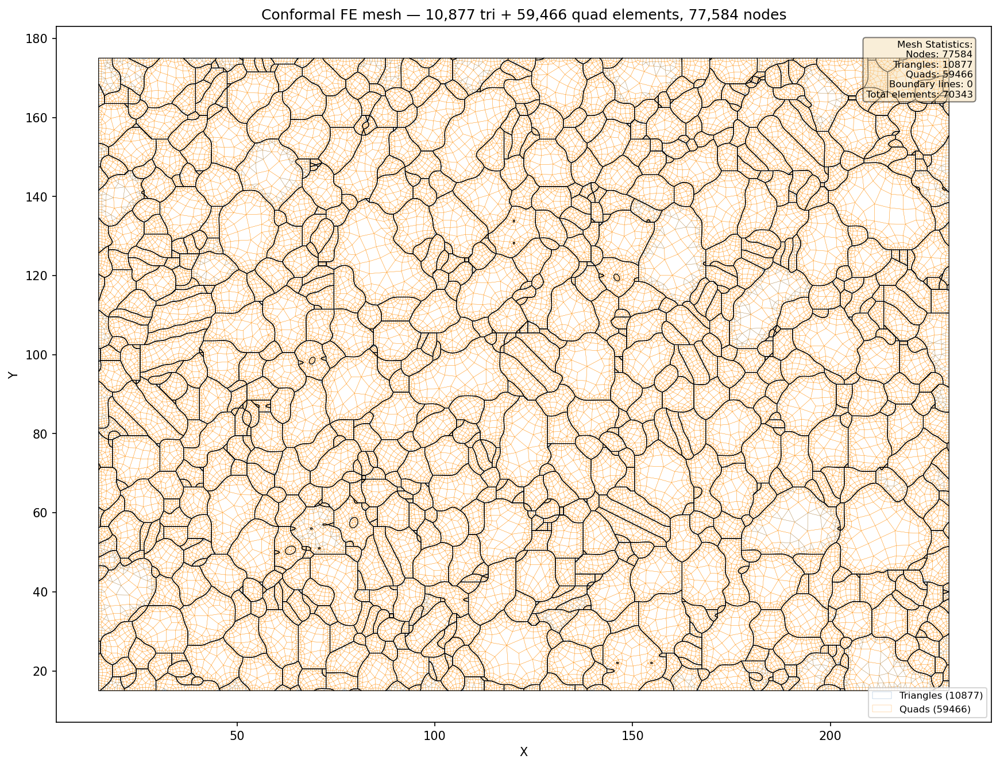

Triangles plotted : 10,877
Quads plotted     : 59,466
Nodes plotted     : 77,584


In [70]:
from upxo.viz.meshviz import see_femesh

# ── Extract nodes from gmsh ──────────────────────────────────────────────────
node_tags, node_coords, _ = gmsh.model.mesh.getNodes()
coords_2d = node_coords.reshape(-1, 3)[:, :2]   # x, y only

# node_tags are 1-based; build a fast lookup array
max_tag    = int(node_tags.max())
tag_to_idx = np.zeros(max_tag + 1, dtype=int)
tag_to_idx[node_tags.astype(int)] = np.arange(len(node_tags))

# ── Collect triangles (Tri3=2, Tri6=9) and quads (Quad4=3, Quad8=16, Quad9=10)
tri_verts  = []
quad_verts = []

for etype, etags, enodes in zip(*gmsh.model.mesh.getElements(dim=2)):
    n_per_elem = len(enodes) // len(etags)
    corners    = enodes.reshape(-1, n_per_elem)
    idx        = tag_to_idx[corners.astype(int)]
    if etype in (2, 9):         # Tri3 or Tri6 — keep first 3 corner nodes
        tri_verts.append(idx[:, :3])
    elif etype in (3, 16, 10):  # Quad4, Quad8, Quad9 — keep first 4 corner nodes
        quad_verts.append(idx[:, :4])

tri_verts  = np.vstack(tri_verts)  if tri_verts  else np.empty((0, 3), dtype=int)
quad_verts = np.vstack(quad_verts) if quad_verts else np.empty((0, 4), dtype=int)

# ── Visualise via see_femesh ─────────────────────────────────────────────────
fig, ax = see_femesh(
    points_2d      = coords_2d,
    lines          = None,
    triangles      = tri_verts  if len(tri_verts)  else None,
    quads          = quad_verts if len(quad_verts) else None,
    figsize        = (12, 9),
    dpi            = 150,
    tri_edgecolor  = 'steelblue',
    tri_linewidth  = 0.2,
    tri_alpha      = 0.7,
    quad_edgecolor = 'darkorange',
    quad_linewidth = 0.2,
    quad_alpha     = 0.7,
    show_axis      = True,
    show_stats     = True,
    title          = (f'Conformal FE mesh — {len(tri_verts):,} tri + '
                      f'{len(quad_verts):,} quad elements, {len(coords_2d):,} nodes'),
)

# Overlay grain boundary polygons (Shapely exterior rings)
for poly in flat_cells.values():
    xs, ys = poly.exterior.xy
    ax.plot(xs, ys, 'k-', linewidth=0.6, zorder=2)

plt.tight_layout()
plt.show()

print(f"Triangles plotted : {len(tri_verts):,}")
print(f"Quads plotted     : {len(quad_verts):,}")
print(f"Nodes plotted     : {len(coords_2d):,}")


## Step 19.7 — Export mesh

Export to `.msh` (gmsh native), `.inp` (Abaqus), or `.vtk`.  
Set the desired path and format below.


In [71]:
import os

OUT_DIR  = r'C:\Development\UPXO\upxo_library\src\upxo\_written_data'
BASENAME = 'repgen_gs_mesh'

os.makedirs(OUT_DIR, exist_ok=True)

# ── gmsh native (.msh v4) ────────────────────────────────────────────────────
msh_path = os.path.join(OUT_DIR, f'{BASENAME}.msh')
gmsh.option.setNumber("Mesh.MshFileVersion", 4.1)
gmsh.write(msh_path)
print(f"Saved  : {msh_path}")

# ── Abaqus (.inp) ────────────────────────────────────────────────────────────
inp_path = os.path.join(OUT_DIR, f'{BASENAME}.inp')
gmsh.write(inp_path)
print(f"Saved  : {inp_path}")

# ── VTK (.vtk) ───────────────────────────────────────────────────────────────
vtk_path = os.path.join(OUT_DIR, f'{BASENAME}.vtk')
gmsh.write(vtk_path)
print(f"Saved  : {vtk_path}")

gmsh.finalize()
print("\ngmsh session finalized.")


Saved  : C:\Development\UPXO\upxo_library\src\upxo\_written_data\repgen_gs_mesh.msh
Saved  : C:\Development\UPXO\upxo_library\src\upxo\_written_data\repgen_gs_mesh.inp
Saved  : C:\Development\UPXO\upxo_library\src\upxo\_written_data\repgen_gs_mesh.vtk

gmsh session finalized.


In [ ]:
manifold_structure.cells